# import packages

In [9]:
library(data.table)
library(dplyr)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
#library(EnsDb.Hsapiens.v75)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(IRdisplay)
library(ChIPpeakAnno)
library(IRdisplay)
library(ggpubr)
library(DiffBind)
library(kableExtra)
library(tidyverse)
library(readxl)
library(umap)
library(ggrepel)
library(msigdbr)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
library(sva)
library(DT)
library(tools)
library(tidyverse)
library(R.utils)

library(edgeR)


In [10]:
source('~/script/utils.r')
wk_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/'
setwd(wk_dir)
data_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/' 

Sys.setenv(PATH='/hpcf/authorized_apps/rhel8_apps/mamba/install/mambaforge/sbin:/hpcf/authorized_apps/rhel8_apps/mamba/install/mambaforge/bin:/opt/TurboVNC/bin:/cm/local/apps/environment-modules/4.5.3/bin:/hpcf/lsf/lsf_prod/10.1/linux3.10-glibc2.17-x86_64/etc:/hpcf/lsf/lsf_prod/10.1/linux3.10-glibc2.17-x86_64/bin:/usr/lpp/mmfs/bin:/usr/lpp/mmfs/lib:/home/whu78/conda3/envs/te/bin:/condabin:/home/whu78/conda3/bin:/usr/local/sbin:/usr/sbin:/sbin:/usr/sbin:/cm/local/apps/environment-modules/4.5.3/bin:/home/whu78/.local/bin:/home/whu78/bin:/usr/sbin:/sbin:/bin:/usr/bin:/etc:/usr/ucb:/usr/local/bin:/usr/local/local_dfs/bin:/usr/bin/X11:/usr/local/sas:/usr/sbin:/sbin:/bin:/usr/bin:/etc:/usr/ucb:/usr/local/bin:/usr/local/local_dfs/bin:/usr/bin/X11:/usr/local/sas:/home/whu78/edirect')


In [11]:
wk_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/'
setwd(wk_dir)


# design table

In [ ]:
# ln -s /research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages/ /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac


In [16]:
flist = dir('fastq_atac/')
flist = flist[grep('fastq.gz', flist)]
dsn_kl = data.table(fname = flist)
dsn_kl[, srr_id := sub('.*(SRR\\d+).*', '\\1', fname)]
dsn_kl[, sample_name := str_extract(fname, '(.*)_', group = 1)]
dsn_kl[, sample_name := sub('_SRR.*', '', sample_name)]
dsn_kl[, fastq := paste0(wk_dir, 'fastq_atac/', fname)]

dsn_kl[, r1r2 := 'R1'] 
dsn_kl[grep('_R2.fastq.gz', fname), r1r2 := 'R2']
dsn_kl = dcast(sample_name + srr_id ~ r1r2, data = dsn_kl, value.var = 'fastq')


In [17]:
head(dsn_kl)

sample_name,srr_id,R1,R2
<chr>,<chr>,<chr>,<chr>
BFUE_ATAC_1,SRR8723726,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/BFUE_ATAC_1_SRR8723726.fastq.gz,NA
BFUE_ATAC_2,SRR8723727,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/BFUE_ATAC_2_SRR8723727.fastq.gz,NA
B_1,SRR2920492,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/B_1_SRR2920492_R1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/B_1_SRR2920492_R2.fastq.gz
B_2,SRR2920513,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/B_2_SRR2920513_R1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/B_2_SRR2920513_R2.fastq.gz
CD4_T_1,SRR2920493,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/CD4_T_1_SRR2920493_R1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/CD4_T_1_SRR2920493_R2.fastq.gz
CD4_T_2,SRR2920496,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/CD4_T_2_SRR2920496_R1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/fastq_atac/CD4_T_2_SRR2920496_R2.fastq.gz


In [18]:
fwrite(dsn_kl, file = 'data/dsn_kl.tsv')

# prepare design table for GSE74912

In [41]:
dsn_gse74912 = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/gse74912_flist')
dsn_gse74912[, srx_id := {system(paste0('esearch -db sra -query "', gsm_id, '" | efetch -format docsum | accn-at-a-time | grep -i srx | tr [:lower:] [:upper:] | tr "\n" "," '), intern = T)}, 
      by = 1:nrow(dsn_gse74912)]
dsn_gse74912[, srr_id := {system(paste0('esearch -db sra -query "', gsm_id, '" | efetch -format docsum | accn-at-a-time | grep -i srr | tr [:lower:] [:upper:] | tr "\n" "," '), intern = T)}, 
      by = 1:nrow(dsn_gse74912)]
      

In [ ]:
# test if there is multiple ids
dsn_gse74912[, nn := length(unlist(strsplit(srx_id, ','))), by = 1:nrow(dsn_gse74912)]
table(dsn_gse74912$nn)
dsn_gse74912[, nn := length(unlist(strsplit(srr_id, ','))), by = 1:nrow(dsn_gse74912)]
table(dsn_gse74912$nn)


In [ ]:
dsn_gse74912[, srx_id := sub(',', '', srx_id)]
dsn_gse74912[, srr_id := sub(',', '', srr_id)]


In [ ]:
head(dsn_gse74912)

In [ ]:
dsn_gse74912$batch = 'gse74912'


In [11]:
#fwrite(dsn_gse74912, file = 'dsn_gse74912.tsv', sep = '\t')
dsn_gse74912 = fread('dsn_gse74912.tsv')


In [12]:
head(dsn_gse74912)

gsm_id,sample_name,srx_id,srr_id,nn,batch
<chr>,<chr>,<chr>,<chr>,<int>,<chr>
GSM1937376,4983-1A,SRX1427789,SRR2920466,1,gse74912
GSM1937377,4983-2A,SRX1427790,SRR2920467,1,gse74912
GSM1937378,4983-3A,SRX1427791,SRR2920468,1,gse74912
GSM1937379,4983-4A,SRX1427792,SRR2920469,1,gse74912
GSM1937380,4983-4B,SRX1427793,SRR2920470,1,gse74912
GSM1937381,4983-5A,SRX1427794,SRR2920471,1,gse74912


# prepare design table fro GSE128266


In [127]:
dsn_gse128266 = fread('/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/gse128266_flist')
dsn_gse128266[, srx_id := {system(paste0('esearch -db sra -query "', gsm_id, '" | efetch -format docsum | accn-at-a-time | grep -i srx | tr [:lower:] [:upper:] | tr "\n" "," '), intern = T)}, 
      by = 1:nrow(dsn_gse128266)]
dsn_gse128266[, srr_id := {system(paste0('esearch -db sra -query "', gsm_id, '" | efetch -format docsum | accn-at-a-time | grep -i srr | tr [:lower:] [:upper:] | tr "\n" "," '), intern = T)}, 
      by = 1:nrow(dsn_gse128266)]
      

In [129]:
# test if there is multiple ids
dsn_gse128266[, nn := length(unlist(strsplit(srx_id, ','))), by = 1:nrow(dsn_gse128266)]
table(dsn_gse128266$nn)
dsn_gse128266[, nn := length(unlist(strsplit(srr_id, ','))), by = 1:nrow(dsn_gse128266)]
table(dsn_gse128266$nn)



 1 
16 


 1 
16 

In [131]:
dsn_gse128266[, srx_id := sub(',', '', srx_id)]
dsn_gse128266[, srr_id := sub(',', '', srr_id)]


In [140]:
dsn_gse128266$batch = 'gse128266'

In [13]:
#fwrite(dsn_gse128266, file = 'dsn_gse128266.tsv', sep = '\t')
dsn_gse128266 = fread('dsn_gse128266.tsv')

In [44]:
head(dsn_gse128266)

gsm_id,sample_name,srx_id,srr_id,nn,batch
<chr>,<chr>,<chr>,<chr>,<int>,<chr>
GSM3669542,HSPC_ATAC_1,SRX5516951,SRR8723724,1,gse128266
GSM3669543,HSPC_ATAC_2,SRX5516952,SRR8723725,1,gse128266
GSM3669544,BFUE_ATAC_1,SRX5516953,SRR8723726,1,gse128266
GSM3669545,BFUE_ATAC_2,SRX5516954,SRR8723727,1,gse128266
GSM3669546,CFUE_ATAC_1,SRX5516955,SRR8723728,1,gse128266
GSM3669547,CFUE_ATAC_2,SRX5516956,SRR8723729,1,gse128266


# merge design table

In [14]:
dsn_gse = rbindlist(list(dsn_gse74912, dsn_gse128266))
head(dsn_gse)


gsm_id,sample_name,srx_id,srr_id,nn,batch
<chr>,<chr>,<chr>,<chr>,<int>,<chr>
GSM1937376,4983-1A,SRX1427789,SRR2920466,1,gse74912
GSM1937377,4983-2A,SRX1427790,SRR2920467,1,gse74912
GSM1937378,4983-3A,SRX1427791,SRR2920468,1,gse74912
GSM1937379,4983-4A,SRX1427792,SRR2920469,1,gse74912
GSM1937380,4983-4B,SRX1427793,SRR2920470,1,gse74912
GSM1937381,4983-5A,SRX1427794,SRR2920471,1,gse74912


In [46]:
nrow(dsn_gse)
nrow(dsn_kl)
intersect(dsn_gse$srr_id, dsn_kl$srr_id)
setdiff(dsn$srr_id, dsn_gse$srr_id)

[1] 146

[1] 46

[1] "SRR2920492" "SRR2920493" "SRR2920494" "SRR2920495" "SRR2920496"
 [6] "SRR2920497" "SRR2920498" "SRR2920499" "SRR2920500" "SRR2920501"
[11] "SRR2920502" "SRR2920505" "SRR2920506" "SRR2920507" "SRR2920508"
[16] "SRR2920509" "SRR2920510" "SRR2920511" "SRR2920513" "SRR2920523"
[21] "SRR8723724" "SRR8723725" "SRR8723726" "SRR8723727" "SRR8723728"
[26] "SRR8723729" "SRR8723730" "SRR8723731" "SRR8723732" "SRR8723733"
[31] "SRR8723734" "SRR8723735" "SRR8723736" "SRR8723737" "SRR8723738"
[36] "SRR8723739"

[1] "SRR2999324" "SRR2999325" "SRR5210376" "SRR7650849" "SRR8247848"
 [6] "SRR8247849" "SRR8247850" "SRR8247851" "SRR8247852" "SRR8247853"

In [ ]:
dsn_merged = merge(dsn_kl, dsn_gse, by = 'srr_id', all = T)
dsn_merged[is.na(sample_name.y), sample_name.y := sample_name.x]
dsn_merged[, sample_name := sample_name.y]
dsn_merged[, sample_name.x := NULL ]
dsn_merged[, sample_name.y := NULL ]

In [23]:
head(dsn_merged)

srr_id,R1,R2,gsm_id,srx_id,nn,batch,sample_name
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>
SRR2920466,NA,NA,GSM1937376,SRX1427789,1,gse74912,4983-1A
SRR2920467,NA,NA,GSM1937377,SRX1427790,1,gse74912,4983-2A
SRR2920468,NA,NA,GSM1937378,SRX1427791,1,gse74912,4983-3A
SRR2920469,NA,NA,GSM1937379,SRX1427792,1,gse74912,4983-4A
SRR2920470,NA,NA,GSM1937380,SRX1427793,1,gse74912,4983-4B
SRR2920471,NA,NA,GSM1937381,SRX1427794,1,gse74912,4983-5A


In [49]:
dsn_merged[!is.na( sample_name.x ) & is.na(sample_name.y), ]

srr_id,sample_name.x,R1,R2,gsm_id,sample_name.y,srx_id,nn,batch,sample_name
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<chr>,<chr>


# download other dataset

In [50]:
dsn = copy(dsn_merged)


In [51]:
fastq_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/'
dsn[, prefetch_cmd := paste0('prefetch ', srr_id, ' -O ', fastq_dir, ' --max-size 40g')]
# if single end seq
dsn[, fastqdump_cmd := paste0('fasterq-dump ', srr_id,  ' --outdir ', fastq_dir, srr_id, '/')]
dsn[, dump_r := paste0(fastq_dir, srr_id, '/', srr_id, '.fastq')]
# if double end seq
dsn[, dump_r1 := paste0(fastq_dir, srr_id, '/', srr_id, '_1.fastq')] 
dsn[, dump_r2 := paste0(fastq_dir, srr_id, '/', srr_id, '_2.fastq')]
dsn[, gz_r_cmd := paste0(' gzip ', dump_r)]
dsn[, gz_r1_cmd := paste0(' gzip ', dump_r1)]
dsn[, gz_r2_cmd := paste0(' gzip ', dump_r2)]


In [ ]:
# script for downloading SRA => fastq => gzip
write(dsn[!file.exists(sra_file) & !file.exists(R1), prefetch_cmd], file = paste0(fastq_dir, 'run_batch2_prefetch.sh'))
write(dsn[file.exists(sra_file) & !(file.exists(dump_r) | file.exists(dump_r1)), fastqdump_cmd], file = paste0(fastq_dir, 'run_batch2_fastqdump_cmd.sh'))


In [537]:
# compress fastq files
dsn[, dump_r_gz := paste0(fastq_dir, srr_id, '/', srr_id, '.fastq.gz')]
# if double end seq
dsn[, dump_r1_gz := paste0(fastq_dir, srr_id, '/', srr_id, '_1.fastq.gz')]
dsn[, dump_r2_gz := paste0(fastq_dir, srr_id, '/', srr_id, '_2.fastq.gz')]

write(dsn[file.exists(dump_r)  & !file.exists(dump_r_gz), gz_r_cmd], file = paste0(wk_dir, 'run_', PP, '_gz_r_cmd.sh'))
write(dsn[file.exists(dump_r1) & !file.exists(dump_r1_gz), gz_r1_cmd], file = paste0(wk_dir, 'run_', PP, '_gz_r1_cmd.sh'))
write(dsn[file.exists(dump_r2) & !file.exists(dump_r2_gz), gz_r2_cmd], file = paste0(wk_dir, 'run_', PP, '_gz_r2_cmd.sh'))


In [549]:
# get the real file path, not link, easier for file test
dsn[, RR1 := Sys.readlink(R1)] 
dsn[, RR2 := Sys.readlink(R2)] 

In [542]:
sum(file.exists(dsn$dump_r1_gz) & !file.exists(dsn$RR1))
sum(!file.exists(dsn$dump_r1_gz) & file.exists(dsn$RR1))


[1] 110

[1] 46

In [485]:
dsn[, sra_file := paste0(fastq_dir, srr_id, '/', srr_id, '.sra')]
file.exists(dsn[!file.exists(dsn$R1), sra_file])


[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [31] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [46] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [61] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [76] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [91] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[106] TRUE TRUE TRUE TRUE TRUE

In [58]:
dsn[, sra_file := paste0(fastq_dir, srr_id, '/', srr_id, '.sra')]
file.exists(dsn[!file.exists(dsn$R1), sra_file])


[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [31] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [46] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [61] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [76] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
 [91] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[106] TRUE TRUE TRUE TRUE TRUE

In [59]:
file.exists(dsn$sra_file)

[1]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [13]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [25]  TRUE  TRUE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE
 [37] FALSE  TRUE  TRUE FALSE FALSE FALSE FALSE FALSE FALSE FALSE  TRUE FALSE
 [49]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE  TRUE  TRUE
 [61]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [73]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [85]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [97]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
[109]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
[121]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE FALSE
[133] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE  TRUE FALSE  TRUE
[145] FALSE  TRUE FALSE  TRUE FALSE  TRUE FALSE  TRUE FALSE  TRUE FALSE  TRUE

In [65]:
# this should be 0
nrow(dsn[file.exists(dump_r) & file.exists(dump_r1), ])


[1] 0

In [66]:
dsn[!file.exists(RR1) & file.exists(dump_r1_gz), RR1 := dump_r1_gz]
dsn[!file.exists(RR2) & file.exists(dump_r2_gz), RR2 := dump_r2_gz]

# there is no such situation
# dsn_merged[!file.exists(R1) & file.exists(dump_ri_gz), RR1 := dump_r_gz]


In [547]:
dim(dsn[!file.exists(RR1), ])

[1] 110  32

In [552]:
all(file.exists(dsn$RR1))
all(file.exists(dsn$RR2))
     

[1] TRUE

[1] FALSE

# export design table

In [46]:
#fwrite(dsn, file = 'data/dsn_te_atac_merged.xls', sep = '\t')
# manual check the files
#dsn = fread('data/dsn_te_atac_merged_bak.txt') 
#dsn = fread('data/dsn_te_atac_merged_v2.xls') 
#atac_dsn = copy(dsn)

In [82]:
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/'
fwrite(dsn[, .(sample_name, sample_name_manual, gsm_id, batch, RR1, RR2)], file = paste0(base_dir, 'share_table_hema_atac.tsv'), sep = '\t')

In [15]:
atac_dsn = fread('~/WenhuoHu/share_table_hema_atac.tsv') 

In [16]:
dim(atac_dsn)
head(atac_dsn[, .(sample_name, sample_name_manual, gsm_id, batch, RR1, RR2)])

[1] 156   6

sample_name,sample_name_manual,gsm_id,batch,RR1,RR2
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
4983-1A,D4983_HSC_1,GSM1937376,gse74912,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920466/SRR2920466_1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920466/SRR2920466_2.fastq.gz
4983-2A,D4983_HSC_1,GSM1937377,gse74912,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920467/SRR2920467_1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920467/SRR2920467_2.fastq.gz
4983-3A,D4983_HSC_1,GSM1937378,gse74912,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920468/SRR2920468_1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920468/SRR2920468_2.fastq.gz
4983-4A,D4983_HSC_1,GSM1937379,gse74912,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920469/SRR2920469_1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920469/SRR2920469_2.fastq.gz
4983-4B,D4983_HSC_1,GSM1937380,gse74912,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920470/SRR2920470_1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920470/SRR2920470_2.fastq.gz
4983-5A,D4983_HSC_1,GSM1937381,gse74912,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920471/SRR2920471_1.fastq.gz,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/ATAC-seq/Hematopoietic_lineages_batch2/SRR2920471/SRR2920471_2.fastq.gz


In [138]:
file.exists(atac_dsn$RR2)

[1]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [13]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [25]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [37]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [49]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [61]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [73]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [85]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
 [97]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
[109]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
[121]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
[133]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE FALSE FALSE FALSE FALSE
[145] FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE FALSE

In [18]:
atac_dsn[, cell_type := unlist(strsplit(sample_name_manual, '_'))[2], by = 1:nrow(atac_dsn)]

# create sample dir

In [19]:
proj_name = 'atac'

In [ ]:
run_dir = paste0(wk_dir, 'data/run_atac/')
atac_dsn[, sample_dir := paste0(run_dir, sample_name, '/')]
atac_dsn[, fname_pre := paste0(run_dir, sample_name, '_', species)]


In [144]:
atac_dsn$sample_dir[1]

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac/4983-1A/"

In [ ]:
# run_dir = paste0(wk_dir, 'data/run_atac/')
dir.create(run_dir, showWarnings = F)
atac_dsn[, {dir.create(sample_dir, showWarnings = F)}, by = 1:nrow(atac_dsn)]


In [22]:
all(dir.exists(atac_dsn$sample_dir))

[1] TRUE

# merge_multi_lanes


In [23]:
library(R.utils)

In [25]:
se_sample = c('D1_HSPC_1',  'D2_HSPC_2',  'D3_BFUE_1',  'D4_BFUE_1',  'D5_CFUE_1',  'D6_CFUE_1',  'D7_proE_1',  'D8_proE_1',  'D9_Ebaso_1', 
  'D10_Ebaso_1',  'D11_Ebaso_1',  'D12_Ebaso_1',  'D13_polyE_1',  'D14_polyE_1',  'D15_orthoE_1',  'D16_orthoE_1') 
pe_sample = setdiff(atac_dsn$sample_name, se_sample)

In [32]:
atac_dsn[, nn := nrow(.SD), by = 'sample_name_manual']
atac_dsn[, sample_dir2 := paste0(wk_dir, 'data/run_atac_merged/', sample_name_manual, '/')]
#atac_dsn[, {dir.create(sample_dir2, showWarnings = F, recursive = T)}, by = 1:nrow(atac_dsn)] 
atac_dsn[, RR1_sample := paste0(sample_dir2, sample_name_manual, '_R1.fastq.gz')]
atac_dsn[, RR2_sample := paste0(sample_dir2, sample_name_manual, '_R2.fastq.gz')]
#atac_dsn[, {if(.SD$nn == 1){createLink(link = RR1_sample, target = RR1)}}, by = 1:nrow(atac_dsn)] 
#atac_dsn[, {if(.SD$nn == 1){createLink(link = RR2_sample, target = RR2)}}, by = 1:nrow(atac_dsn)] 


In [31]:
atac_dsn[, merge_jobname := paste0('cuta_', sample_name, '_', proj_name)]
atac_dsn[, merge_oo := paste0(sample_dir, sample_name, '_', merge_jobname, '_out')]
atac_dsn[, merge_eo := paste0(sample_dir, sample_name, '_', merge_jobname, '_err')]
atac_dsn[, merge_cmd := paste0('bsub -J ', merge_jobname, ' -n 10 -o ', merge_oo, ' -e ', merge_eo)]
atac_dsn[,  merge_cmd := paste0(merge_cmd, ' " cat ', paste(.SD$RR1, collapse = ' '), ' > ', RR1_sample, '"')]

write(atac_dsn[nn > 1, ][!duplicated(sample_name_manual), merge_cmd], file = paste0(wk_dir, 'run_r1_merge.sh'))



In [33]:
atac_dsn[, merge_jobname := paste0('cuta_', sample_name, '_', proj_name)]
atac_dsn[, merge_oo := paste0(sample_dir, sample_name, '_', merge_jobname, '_out')]
atac_dsn[, merge_eo := paste0(sample_dir, sample_name, '_', merge_jobname, '_err')]
atac_dsn[, merge_cmd := paste0('bsub -J ', merge_jobname, ' -n 10 -o ', merge_oo, ' -e ', merge_eo)]
atac_dsn[, merge_cmd := paste0(merge_cmd, ' " cat ', paste(.SD$RR2, collapse = ' '), ' > ', RR2_sample, '"')]

write(atac_dsn[nn > 1, ][!duplicated(sample_name_manual), merge_cmd], file = paste0(wk_dir, 'run_r2_merge.sh'))


In [149]:
fwrite(atac_dsn, file = 'dsn_beforeMerged_Oct21.tsv')

In [28]:
atac_dsn = fread('dsn_beforeMerged_Oct21.tsv')

In [29]:
dim(atac_dsn)

[1] 156  17

In [34]:
# checkpoint for design table
atac_dsn = atac_dsn[!duplicated(sample_name_manual), ]
atac_dsn[, sample_name := sample_name_manual] 


In [35]:
dim(atac_dsn)

[1] 96 17

In [36]:
atac_dsn[, sample_dir := sample_dir2 ]

In [37]:
head(atac_dsn$sample_dir)

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/"   
[2] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D6792_HSC_1/"   
[3] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D7291_CD34_1/"  
[4] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D7292_CD34_2/"  
[5] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D1020_CBCD34_1/"
[6] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D1022_B_1/"

# sample summary

In [38]:
dim(atac_dsn)
atac_dsn[, donor := unlist(strsplit(sample_name_manual, '_'))[1], by = 1:nrow(atac_dsn)]
atac_dsn[, cell_type := unlist(strsplit(sample_name_manual, '_'))[2], by = 1:nrow(atac_dsn)]
atac_dsn[, replicate := unlist(strsplit(sample_name_manual, '_'))[3], by = 1:nrow(atac_dsn)]
atac_dsn[, donor_type := 'ctrl']
atac_dsn[grep('SU', donor), donor_type := 'AML']


[1] 96 17

In [114]:
table(atac_dsn$donor_type)


 AML ctrl 
  38   58 

In [649]:
library(knitr)
library(kableExtra)
library(IRdisplay)


In [ ]:
atac_dsn[, .(sample_name_manual, donor_type, cell_type, replicate, batch)] %>%  
    kable("html") %>%
    as.character() %>%
    display_html()

# cutadapt

In [20]:
# module load cutadapt/4.4
proj_name = 'atac'
atac_dsn[, fastq_r1_trimmed := paste0(sample_dir, sample_name, '_R1_trimmed.fa.gz')]
atac_dsn[, fastq_r2_trimmed := paste0(sample_dir, sample_name, '_R2_trimmed.fa.gz')]
atac_dsn[, cutadapt_jobname := paste0('cuta_', sample_name, '_', proj_name)]
atac_dsn[, cutadapt_oo := paste0(sample_dir, sample_name, '_', cutadapt_jobname, '_out')]
atac_dsn[, cutadapt_eo := paste0(sample_dir, sample_name, '_', cutadapt_jobname, '_err')]
atac_dsn[, cutadapt_cmd := paste0('bsub -J ', cutadapt_jobname, ' -n 2 -W 90:00 -o ', cutadapt_oo, ' -e ', cutadapt_eo)]
atac_dsn[file.exists(RR2),  cutadapt_cmd := paste0(cutadapt_cmd, ' " cutadapt -o ', fastq_r1_trimmed, ' -p ', fastq_r2_trimmed, ' ', RR1, ' ', RR2, '"')]
atac_dsn[!file.exists(RR2), cutadapt_cmd := paste0(cutadapt_cmd, ' " cutadapt -o ', fastq_r1_trimmed, ' ', RR1, '"')]
head(atac_dsn[!file.exists(fastq_r1_trimmed) | file.size(fastq_r1_trimmed) < 500000, cutadapt_cmd], 1)
#write(atac_dsn[count_file == 'No', cutadapt_cmd], file = paste0(base_dir, 'run_cutadapt.sh'))
#write(atac_dsn[!file.exists(fastq_r1_trimmed) | file.size(fastq_r1_trimmed) < 500000, cutadapt_cmd], file = paste0(wk_dir, 'run_', PP, '_cutadapt.sh'))
write(atac_dsn[, cutadapt_cmd], file = paste0(wk_dir, 'run_', proj_name, '_cutadapt.sh'))


character(0)

# bowtie2 index T2T genome

# alignment

In [21]:
species = 't2t'
if(species == 'hg38') {
    ref_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/YuannyuZhang/Data/UCSC/hg38/Bowtie2Index'
}else if(species == 'hg19'){
    ref_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/YuannyuZhang/Data/For_RNA-Seq/Homo_sapiens/UCSC/hg19/Sequence/Bowtie2Index'
}else if(species == 'mosue'){
    ref_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/YuannyuZhang/Data/For_RNA-Seq/Mus_musculus/UCSC/mm10/Sequence/Bowtie2Index'
}else if(species == 't2t'){
    ref_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/genomes/t2t/bowtie2_index/bowtie2_index'
}

In [22]:
atac_dsn$species = species

In [23]:
atac_dsn[, cell_type := unlist(strsplit(sample_name_manual, '_'))[2], by = 1:nrow(atac_dsn) ]

In [24]:
head(atac_dsn[, .(sample_name, sample_name_manual, sample_dir, cell_type, species)])

sample_name,sample_name_manual,sample_dir,cell_type,species
<chr>,<chr>,<chr>,<chr>,<chr>
D4983_HSC_1,D4983_HSC_1,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/,HSC,t2t
D6792_HSC_1,D6792_HSC_1,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D6792_HSC_1/,HSC,t2t
D7291_CD34_1,D7291_CD34_1,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D7291_CD34_1/,CD34,t2t
D7292_CD34_2,D7292_CD34_2,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D7292_CD34_2/,CD34,t2t
D1020_CBCD34_1,D1020_CBCD34_1,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D1020_CBCD34_1/,CBCD34,t2t
D1022_B_1,D1022_B_1,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D1022_B_1/,B,t2t


In [25]:
atac_dsn[, fname_pre := paste0(sample_dir, sample_name, '_', species)]
atac_dsn[, fname_preK100 := paste0(sample_dir, sample_name, '_bowtie2K100_', species)]
atac_dsn[, fname_preA := paste0(sample_dir, sample_name, '_bowtie2A_', species)]
atac_dsn[, sam_file := paste0(fname_preK100, '.sam')]

atac_dsn[, bow2A_jobname := paste0('bow2A_', sample_name, '_', proj_name)]
atac_dsn[, bow2A_oo := paste0(sample_dir, 'bow2A_', sample_name, '_out')]
atac_dsn[, bow2A_eo := paste0(sample_dir, 'bow2A_', sample_name, '_err')]
atac_dsn[, samA_report_file := paste0(fname_pre, '_bowtie2Report.txt')]

# -k aln times
atac_dsn[, bow2A_cmd := paste0('bsub -J ', bow2A_jobname, ' -o ', bow2A_oo, ' -e ', bow2A_eo)]
atac_dsn[, bow2A_cmd := paste0(bow2A_cmd, ' -n 10 -R "rusage[mem=5GB]" -R "span[hosts=1]" -W 199:00')]
atac_dsn[file.exists(RR2),  bow2A_cmd := paste0(bow2A_cmd, ' " bowtie2 -p 10 -k 100 -x ', ref_dir, ' -1 ', fastq_r1_trimmed, ' -2 ', fastq_r2_trimmed)]
atac_dsn[!file.exists(RR2), bow2A_cmd := paste0(bow2A_cmd, ' " bowtie2 -p 10 -k 100 -x ', ref_dir, ' -U ', fastq_r1_trimmed, ' ')]
atac_dsn[, bow2A_cmd := paste0(bow2A_cmd, ' -S ', sam_file, ' "')]

fname = paste0('run_atac_bow2AA.sh')
write(atac_dsn[, bow2A_cmd], file = fname)

# 81 -- 96 is single end, not paired

In [56]:
atac_dsn$sam_file[1]
file.exists(atac_dsn$sam_file[1])

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac/4983-1A/4983-1A_bowtie2K100_t2t.sam"

[1] FALSE

In [70]:
atac_dsn[, xx := NULL]

In [ ]:
grep -m 1 "bowtie" /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_t2t.sam


In [66]:
system('grep -m 1 "bowtie" /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_t2t.sam', intern = T)

[1] "@PG\tID:bowtie2\tPN:bowtie2\tVN:2.5.4\tCL:\"/home/whu78/conda3/envs/feb24/bin/bowtie2-align-s --wrapper basic-0 -a -x /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/genomes/t2t/bowtie2_index/bowtie2_index -S /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_t2t.sam -1 /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_R1_trimmed.fa.gz -2 /research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_R2_trimmed.fa.gz\""

In [164]:
atac_dsn[, xx := {system(paste0('grep -m 1 "bowtie" ', .SD$sam_file), intern = T)}, by = 1:nrow(atac_dsn) ]

In [165]:
atac_dsn[cell_type %in% c('HSC', 'CMP', 'GMP', 'Mono', 'Neu'), sam_file][2]

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D6792_HSC_1/D6792_HSC_1_bowtie2K100_t2t.sam"

In [166]:
dim(atac_dsn)

[1] 96 36

# samtools: sam to bam

In [26]:
atac_dsn[, sam2bam_jobname := paste0('sam2bam_', sample_name, '-', proj_name)]
atac_dsn[, sam2bam_oo := paste0(sample_dir, 'sam2bam_', sample_name, '_out')]
atac_dsn[, sam2bam_eo := paste0(sample_dir, 'sam2bam_', sample_name, '_err')]
atac_dsn[, bam_file := sub('.sam$', '.bam', sam_file) ]

# -k aln times
atac_dsn[, sam2bam_cmd := paste0('bsub -J ', sam2bam_jobname, ' -o ', sam2bam_oo, ' -e ', sam2bam_eo)]
atac_dsn[, sam2bam_cmd := paste0(sam2bam_cmd, '  -n 10 -R "rusage[mem=5GB]" -R "span[hosts=1]" -W 90')]
atac_dsn[, sam2bam_cmd := paste0(sam2bam_cmd, ' " samtools view -bS ', sam_file, ' > ', bam_file, '"')]

fname = paste0('run_atac_sam2bam.sh')
fname
write(atac_dsn[, sam2bam_cmd], file = fname)


[1] "run_atac_sam2bam.sh"

In [668]:
atac_dsn[is.na(sam_file), RR1_sample]
#file.exists(dsn[is.na(sam_file), RR1_sample])

character(0)

# bedtools: bam2bed

In [27]:
atac_dsn[, bam2bed_jobname := paste0('bam2bed_', sample_name)]
atac_dsn[, bam2bed_oo := paste0(sample_dir, 'bam2bed_', sample_name, '_out')]
atac_dsn[, bam2bed_eo := paste0(sample_dir, 'bam2bed_', sample_name, '_err')]
atac_dsn[, bed_file := sub('.bam', '.bed', bam_file) ]

atac_dsn[, bam2bed_cmd := paste0('bsub -J ', bam2bed_jobname, ' -o ', bam2bed_oo, ' -e ', bam2bed_eo)]
atac_dsn[, bam2bed_cmd := paste0(bam2bed_cmd, ' -n 8 -R "rusage[mem=5GB]" -R "span[hosts=1]" -W 90')]
atac_dsn[, bam2bed_cmd := paste0(bam2bed_cmd, ' " bedtools bamtobed -i ', bam_file, ' > ', bed_file, '"')]

fname = paste0('run_atac_bam2bed.sh')
fname
write(atac_dsn[, bam2bed_cmd], file = fname)


[1] "run_atac_bam2bed.sh"

In [169]:
atac_dsn[, nn := nrow(.SD), by = 'cell_type'] 

In [130]:
atac_dsn$nn

[1]  4  4  2  2  1  3  4  4  4  4  4  3  1  3  1  4  1  1  4  3  4  4  4  3  4
[26]  4  3  3  4  3  3  4 15 15 15  8 15 15  8 15 15 15 15 15 15 15 15  8 15 15
[51]  8 15 15 15 15  8 15 15 15 15  8 15 15  8 15 15 15 15  8 15  2  2  1  1  3
[76]  3  3  3  3  3  2  2  2  2  2  2  2  2  4  4  4  4  2  2  2  2

In [144]:
table(atac_dsn$cell_type)


      B    BFUE   blast  CBCD34    CD34     CD4     CD8    CFUE     CLP     CMP 
      3       2      15       1       2       4       4       2       3       1 
     DC      EB   Ebaso     GMP     HSC    HSPC     LSC     MEP    Mono     MPP 
      1       3       4       1       4       2       8       1       1       1 
    Neu      NK  orthoE    pHSC   polyE preproB    ProB    proE 
      2       4       2      15       2       3       3       2 

In [28]:
# combine bam files for bam2bed
atac_dsn[, bam2bed_jobname := paste0('bam2bed_', sample_name, '_atac')]
atac_dsn[, bam2bed_oo := paste0(bam2bed_jobname, '_out')]
atac_dsn[, bam2bed_eo := paste0(bam2bed_jobname, '_err')]
atac_dsn[, bed_file := sub('.bam$', '_celltype.bed', bam_file) ]

atac_dsn[, bam2bed_cmd := paste0('bsub -J ', bam2bed_jobname, ' -o ', bam2bed_oo, ' -e ', bam2bed_eo)]
atac_dsn[, bam2bed_cmd := paste0(bam2bed_cmd, ' -n 8 -R "rusage[mem=5GB]" -R "span[hosts=1]" -W 90')]
atac_dsn[, bam2bed_cmd := paste0(bam2bed_cmd, ' " samtools merge -f - ', paste(.SD$bam_file, collapse = ' '), ' | bedtools bamtobed -i - > ', bed_file, '" \n'), by = 'cell_type' ]

write(atac_dsn[!duplicated(cell_type), bam2bed_cmd], file = 'run_bam2bed.sh')


In [38]:
atac_dsn[, bed_file := sub('.bam$', '_celltype.bed', bam_file) ]


In [39]:
atac_dsn2 = atac_dsn[!duplicated(cell_type), ]

In [30]:
atac_dsn2$bam_file[1]


[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_bowtie2K100_t2t.bam"

In [36]:
file.size(atac_dsn2$bam_file) 


ERROR: Error in file.info(..., extra_cols = FALSE): invalid filename argument


# bed2normed_wig

In [37]:
atac_dsn2$bed_file[1]

NULL

In [31]:
#atac_dsn2[, fac := {system(paste0('wc -l ', bed_file, ' | cut -f 1 -d " "'), intern = T)}, by = 1:nrow(atac_dsn2)]
#atac_dsn2[, fac := as.numeric(fac) ]
#breakpoint 
fwrite(atac_dsn2, file = 'atac_dsn2_withfac.tsv', sep = '\t')

In [32]:
atac_dsn2 = fread('atac_dsn2_withfac.tsv')

In [59]:
# module load bed2wig/2.7.10a
chromSize_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/YuannyuZhang/Data/chromSize'
python_dir    = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/YuannyuZhang/scripts/python_scripts/'
chrom_size_file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/genomes/t2t/t2t_sizes_genome'

atac_dsn2[, wig_file := sub('bed$', 'wig', bed_file) ]

# calculate norm factor
# it takes time, comment out saving time
# these steps are requested for new calculation
atac_dsn2[, fac_n := 10000000 / fac] 
atac_dsn2[, fac_nn := paste0(fac_n, ',0')]

atac_dsn2[, bed2wig_jobname := paste0('bed2wig_', sample_name, '_', proj_name)]
atac_dsn2[, bed2wig_oo := paste0(sample_dir, 'bed2wig_', sample_name, '_out')]
atac_dsn2[, bed2wig_eo := paste0(sample_dir, 'bed2wig_', sample_name, '_err')]

atac_dsn2[, bed2wig_cmd := paste0('bsub -J ', bed2wig_jobname, ' -o ', bed2wig_oo, ' -e ', bed2wig_eo)]
atac_dsn2[, bed2wig_cmd := paste0(bed2wig_cmd, '  -n 5 -R "rusage[mem=10GB]" -R "span[hosts=1]" -W 90:00')]
atac_dsn2[, bed2wig_cmd := paste0(bed2wig_cmd, ' " python3 ', '/home/whu78/script/iBed2Wiggle.py --inFile ', bed_file, ' --outFile ', sample_dir, ' ')] 
atac_dsn2[, bed2wig_cmd := paste0(bed2wig_cmd, ' --chromSize ', chrom_size_file, ' --normFactor ', fac_nn, ' "')] 

write(atac_dsn2[!file.exists(atac_dsn2$wig_file), bed2wig_cmd], file = paste0('run_bed2wig_step1.sh'))


In [41]:
atac_dsn2[, wig_file := sub('bed$', 'wig', bed_file) ]
atac_dsn2[, bigwig_file := sub('wig$', 'bigwig', wig_file)] 


In [237]:
# rsync -aP rsync://hgdownload-sd.soe.ucsc.edu/genome/admin/exe/linux.x86_64/ /home/whu78/repos/ucsc_tools/wigToBigWig


In [60]:
# step2
# module load bed2wig2/2.7.10a
atac_dsn2[, bigwig_file := sub('wig$', 'bigwig', wig_file)] 

atac_dsn2[, bed2wig2_jobname := paste0('bed2wig2_', sample_name, '_', proj_name)]

atac_dsn2[, bed2wig2_oo := paste0(sample_dir, bed2wig2_jobname, '_out')]
atac_dsn2[, bed2wig2_eo := paste0(sample_dir, bed2wig2_jobname, '_err')]

atac_dsn2[, bed2wig2_cmd := paste0('bsub -J ', bed2wig2_jobname, ' -o ', bed2wig2_oo, ' -e ', bed2wig2_eo)]
atac_dsn2[, bed2wig2_cmd := paste0(bed2wig2_cmd, ' -n 5 -R "rusage[mem=8GB]" -R "span[hosts=1]"  -W 20:00')]
atac_dsn2[, bed2wig2_cmd := paste0(bed2wig2_cmd, ' " wigToBigWig -clip ', wig_file, ' ', chrom_size_file, ' ', bigwig_file, ' " ')]

write(atac_dsn2[, bed2wig2_cmd], file = paste0('run_bed2wig_step2.sh'))


In [64]:
head(atac_dsn2[cell_type %in% c('HSC', 'CMP', 'GMP'), .(cell_type, bam_file, wig_file)]) 

cell_type,bam_file,wig_file
<chr>,<chr>,<chr>
HSC,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_bowtie2K100_t2t.bam,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_bowtie2K100_t2t_celltype.wig
CMP,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D2596_CMP_1/D2596_CMP_1_bowtie2K100_t2t.bam,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D2596_CMP_1/D2596_CMP_1_bowtie2K100_t2t_celltype.wig
GMP,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D2596_GMP_1/D2596_GMP_1_bowtie2K100_t2t.bam,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D2596_GMP_1/D2596_GMP_1_bowtie2K100_t2t_celltype.wig


In [42]:
head(atac_dsn2[grep('HSC', sample_name), .(cell_type, bam_file, wig_file, bigwig_file)]) 


cell_type,bam_file,wig_file,bigwig_file
<chr>,<chr>,<chr>,<chr>
HSC,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_bowtie2K100_t2t.bam,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_bowtie2K100_t2t_celltype.wig,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_bowtie2K100_t2t_celltype.bigwig
pHSC,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/SU048_pHSC_1/SU048_pHSC_1_bowtie2K100_t2t.bam,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/SU048_pHSC_1/SU048_pHSC_1_bowtie2K100_t2t_celltype.wig,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/SU048_pHSC_1/SU048_pHSC_1_bowtie2K100_t2t_celltype.bigwig


# peak calling 

In [61]:
# step2
# module load macs2/2.7.10a

qvalue_cutoff = 0.05 

atac_dsn2[, macs2_jobname := paste0('macs2_', sample_name, '_', proj_name)]
atac_dsn2[, macs2_oo := paste0(sample_dir, 'macs2_', sample_name, '_out')]
atac_dsn2[, macs2_eo := paste0(sample_dir, 'macs2_', sample_name, '_err')]

atac_dsn2[, macs2_cmd := paste0('bsub -J ', macs2_jobname, ' -o ', macs2_oo, ' -e ', macs2_eo)]
atac_dsn2[, macs2_cmd := paste0(macs2_cmd, ' -n 6 -R "rusage[mem=10GB]" -R "span[hosts=1]" -W 90:00 ')]
atac_dsn2[, macs2_cmd := paste0(macs2_cmd, ' " macs2 callpeak -q ', qvalue_cutoff, ' -t ', bed_file, ' --name ', fname_preA, '_bowtie2_nomodel --nomodel -f BED "')]

write(atac_dsn2[, macs2_cmd], file = paste0('run_macs.sh'))


In [329]:
dim(dsn2)

[1] 28 87

In [164]:
atac_dsn2$bed_file[1]

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_bowtie2K100_t2t_celltype.bed"

In [62]:
atac_dsn2[, peak_file := paste0(sample_dir, sample_name, '_bowtie2A_t2t_bowtie2_nomodel_peaks.xls')] 
atac_dsn2[, narrowpeak_file := paste0(sample_dir, sample_name, '_bowtie2A_t2t_bowtie2_nomodel_peaks.narrowPeak')] 
#/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_t2t_bowtie2_nomodel_peaks.xls
atac_dsn2$peak_file[1]
file.exists(atac_dsn2$narrowpeak_file)
#D4983_HSC_1_bowtie2A_t2t_bowtie2_nomodel_peaks.xls


[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_bowtie2A_t2t_bowtie2_nomodel_peaks.xls"

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[16] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

In [182]:
# checkpoint
fwrite(atac_dsn2, file = 'atac_dsn2_cell_type_oct21.dsv', sep = '\t')

In [9]:
atac_dsn2 = fread('atac_dsn2_cell_type_oct21.dsv')

In [13]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan"

# import peaks

In [170]:
peak_list = lapply(atac_dsn2$peak_file, function(fname){
    tmp = fread(fname)
    setnames(tmp, 7, 'pval')
    setnames(tmp, 8, 'FC')
    setnames(tmp, 8, 'FDR')
    tmp$name = paste0('peak_', 1:nrow(tmp))
    tmp
})

In [171]:
atac_dsn2$cell_type

[1] "HSC"     "CD34"    "CBCD34"  "B"       "CD4"     "CD8"     "NK"     
 [8] "CLP"     "CMP"     "EB"      "GMP"     "MEP"     "MPP"     "blast"  
[15] "pHSC"    "LSC"     "Neu"     "DC"      "Mono"    "preproB" "ProB"   
[22] "HSPC"    "BFUE"    "CFUE"    "proE"    "Ebaso"   "polyE"   "orthoE"

In [172]:
names(peak_list) = atac_dsn2$cell_type
atac_peak_dt = rbindlist(peak_list, idcol = T)

In [177]:
head(atac_peak_dt)

.id,chr,start,end,length,abs_summit,pileup,pval,FDR,-log10(qvalue),name
<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>
HSC,chr1,26,2136,2111,410,194,56.69750,4.00411,54.12750,peak_1
HSC,chr1,2407,2642,236,2493,89,5.10200,1.61406,3.89896,peak_2
HSC,chr1,2746,3187,442,3020,101,7.62382,1.78697,6.30995,peak_3
HSC,chr1,3441,3809,369,3582,154,25.73460,2.65139,23.87710,peak_4
HSC,chr1,12277,13005,729,12765,81,23.19850,3.72051,21.40260,peak_5
HSC,chr1,15322,15880,559,15585,100,43.43620,5.67416,41.14350,peak_6


In [139]:
table(atac_dsn2$cell_type)


      B    BFUE   blast  CBCD34    CD34     CD4     CD8    CFUE     CLP     CMP 
      1       1       1       1       1       1       1       1       1       1 
     DC      EB   Ebaso     GMP     HSC    HSPC     LSC     MEP    Mono     MPP 
      1       1       1       1       1       1       1       1       1       1 
    Neu      NK  orthoE    pHSC   polyE preproB    ProB    proE 
      1       1       1       1       1       1       1       1 

In [176]:
rm(peak_list)

In [174]:
saveRDS(atac_peak_dt, file = 'rds/nb_TE_HSC_ATAC_bowtieWa__celltype__peaks_dt.rds')

In [10]:
atac_peak_dt = readRDS('nb_TE_HSC_ATAC_bowtieWa__celltype__peaks_dt.rds')

In [14]:
head(atac_peak_dt)

.id,chr,start,end,length,abs_summit,pileup,pval,FDR,-log10(qvalue),name
<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>
HSC,chr1,26,2136,2111,410,194,56.69750,4.00411,54.12750,peak_1
HSC,chr1,2407,2642,236,2493,89,5.10200,1.61406,3.89896,peak_2
HSC,chr1,2746,3187,442,3020,101,7.62382,1.78697,6.30995,peak_3
HSC,chr1,3441,3809,369,3582,154,25.73460,2.65139,23.87710,peak_4
HSC,chr1,12277,13005,729,12765,81,23.19850,3.72051,21.40260,peak_5
HSC,chr1,15322,15880,559,15585,100,43.43620,5.67416,41.14350,peak_6


# genome overall comparison between HPSC vs CMP

In [41]:
plotdat = as.data.table(table(atac_peak_dt$.id) ) 


In [42]:
plotdat

V1,N
<chr>,<int>
B,696459
BFUE,745715
blast,789141
CBCD34,471157
CD34,549352
CD4,660073
CD8,661790
CFUE,786789
CLP,583595


In [43]:
length(lvl)

[1] 27

In [46]:
setdiff(unlist(plotdat[, 1]), lvl)

[1] "B"    "BFUE"

In [49]:
lvl = c(
'HSC', 
'HSPC', 
'pHSC', 
'MPP', 
'CBCD34', 
'CD34', 
'CMP', 
'GMP', 
'MEP', 
'BFUE', 
'CFUE', 
'proE', 
'EB', 
'Ebaso', 
'polyE', 
'orthoE',
'Mono', 
'Neu', 
'DC', 
'LSC', 
'blast', 
'CLP', 
'B',
'preproB', 
'ProB', 
'CD4', 
'CD8', 
'NK')


In [50]:
plotdat[, V1 := factor(V1, levels = lvl) ]
head(plotdat)

V1,N
<fct>,<int>
B,696459
BFUE,745715
blast,789141
CBCD34,471157
CD34,549352
CD4,660073


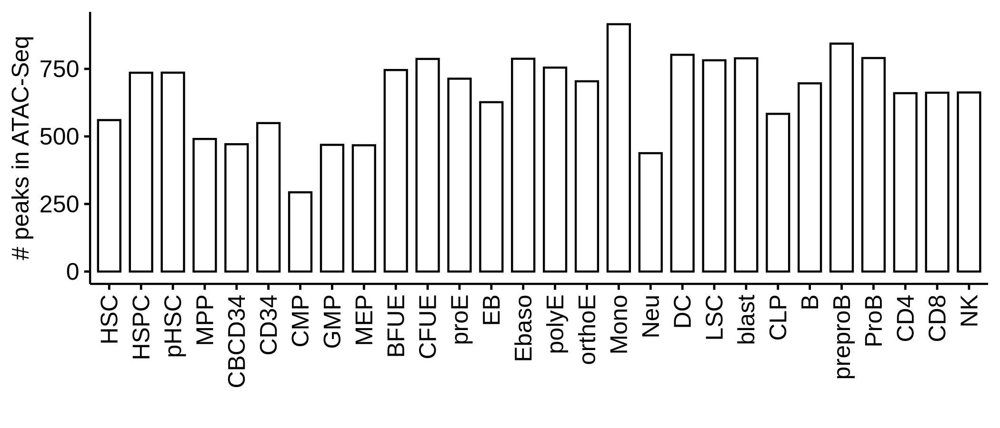

In [56]:
options(repr.plot.width = 7, repr.plot.height = 3, repr.plot.res = 300)
plotdat[, nn := N / 1000]
gg = ggbarplot(plotdat, x = 'V1', y = 'nn') + rotate_x_text(angle = 90) + ylab('# peaks in ATAC-Seq') + xlab('')
fname = '~/WenhuoHu/collab_Farhan/plot/atac_cellType_peakn.pdf'
ggsave(gg, file = fname, width = 6, height = 3)
gg


In [29]:
plotdat = aggregate(atac_peak_dt$length, by = list(atac_peak_dt$.id), sum)


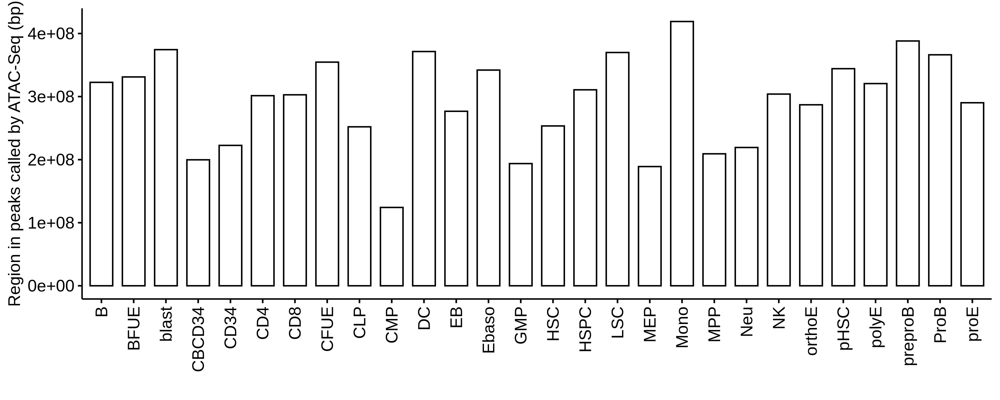

In [32]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 300)
ggbarplot(plotdat, x = 'Group.1', y = 'x') + rotate_x_text(angle = 90) + ylab('Region in peaks called by ATAC-Seq (bp)') + xlab('')

# deeptools how is the DEG TEs in HSC vs CMP TElocal overlap with these peaks

## load data

In [8]:
# load down-regulated TEs in CMP compared with HSC
te_dt = readRDS('~/WenhuoHu/collab_Farhan/data/te_dt_may08.rds')
gr_anno = readRDS(file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/deg_teloccal_cmp_anno.rds')
ann = as.data.table(gr_anno@anno)
ann[, anno := annotation ]
ann[grep('Intron', annotation), anno := 'Intron' ]
ann[grep('Exon', annotation), anno := 'Exon' ]
ann[grep("3' UTR", annotation), anno := 'UTR3' ]
ann[grep("5' UTR", annotation), anno := 'UTR5' ]
ann[grep("Promoter", annotation), anno := 'Promoter' ]
ann[grep("Distal Intergenic", annotation), anno := 'Distal' ]
ann[grep("Downstream", annotation), anno := 'Downstream' ]
ann[, strand := NULL ]
ann[, class_id := unlist(strsplit(.SD$name, ':'))[4], by = 1:nrow(ann) ]
ann[, gene_id := unlist(strsplit(.SD$name, ':'))[3], by = 1:nrow(ann) ]
ann[geneStrand == 1, geneStrand2 := '+' ]
ann[geneStrand == 2, geneStrand2 := '-' ]
ann = merge(ann, te_dt[, .(idd, strand)], by.x = 'name', by.y = 'idd', all.x = T)

table(ann$anno)



    Distal Downstream       Exon     Intron   Promoter       UTR3       UTR5 
     83656         90       1077      80738      11625        673        283 

In [9]:
ann[, tx_id := unlist(strsplit(.SD$name, ':'))[1], by = 1:nrow(ann) ]
ann[, gene_id := unlist(strsplit(.SD$name, ':'))[2], by = 1:nrow(ann) ]
ann[, family_id := unlist(strsplit(.SD$name, ':'))[3], by = 1:nrow(ann) ]
ann[, class_id := unlist(strsplit(.SD$name, ':'))[4], by = 1:nrow(ann) ]
ann[, te_id := paste0(gene_id, ':', family_id, ':', class_id) ]


In [67]:
saveRDS(ann, file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/deg_teloccal_cmp_anno_nov7.rds')

In [9]:
summary(ann$width)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   11.0   180.0   386.0   666.7   808.0  8796.0 

In [68]:
table(ann$class_id)



   DNA   LINE    LTR 
  4192 149611  24339 

In [11]:
dsn_sel2 = atac_dsn2[cell_type %in% c('HSC', 'CMP', 'GMP'), ]

In [66]:
head(dsn_sel2[, .(sample_name, cell_type, narrowpeak_file)])

sample_name,cell_type,narrowpeak_file
<chr>,<chr>,<chr>
D4983_HSC_1,HSC,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D4983_HSC_1/D4983_HSC_1_bowtie2A_t2t_bowtie2_nomodel_peaks.narrowPeak
D2596_CMP_1,CMP,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D2596_CMP_1/D2596_CMP_1_bowtie2A_t2t_bowtie2_nomodel_peaks.narrowPeak
D2596_GMP_1,GMP,/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/run_atac_merged/D2596_GMP_1/D2596_GMP_1_bowtie2A_t2t_bowtie2_nomodel_peaks.narrowPeak


## host gene activity in ATAC-Seq

In [371]:
write(paste('rm hsc_atac_concensus.bed '), file = 'run.sh')
system(paste0('sort -T "." -k1,1 -k2,2n ', paste(dsn_sel2$narrowpeak_file, collapse = ' '), ' | mergeBed > hsc_atac_concensus.bed'), wait = F)


In [112]:
cl = fread('~/WenhuoHu/collab_Farhan/cluster.tsv') 
cl[, class_id := unlist(strsplit(.SD$gene, ':'))[3], by = 1:nrow(cl) ]
cl[, family_id := unlist(strsplit(.SD$gene, ':'))[2], by = 1:nrow(cl) ]
cl[, gene_id := unlist(strsplit(.SD$gene, ':'))[1], by = 1:nrow(cl) ]
tmp = ann[ anno != 'Distal'  & class_id %in% c('LINE') & family_id %in% cl$family_id & gene_id %in% cl$gene_id, ]
dim(tmp) 
tmp = tmp[!duplicated(geneId),] 
dim(tmp)

tmp$geneId

[1] 8295   25

[1] 1032   25

[1] "TLK1"            "LOC124906136"    "RPS15AP10"       "LOC644462"      
   [5] "FHOD3"           "PYY2"            "CRLF3"           "TUBBP8"         
   [9] "LRRC9"           "LOC101928362"    "NSA2P2"          "CORO1C"         
  [13] "SNORD98"         "BMPR1A"          "XKR6"            "SPIDR"          
  [17] "AOAH"            "GPLD1"           "SMAP1"           "LOC105377979"   
  [21] "GALNT10"         "DNAJB14"         "TENM3"           "SLMAP"          
  [25] "LNP1"            "GMPS"            "LOC124908099"    "DPP10-AS1"      
  [29] "SNORA86"         "NEURL1-AS1"      "LOC112268046"    "PACRGL"         
  [33] "SLC10A7"         "LOC105377474"    "ZNF652P1"        "LOC105374039"   
  [37] "TPRG1"           "H2BC12L"         "RNY4P13"         "CEP112"         
  [41] "LOC105370528"    "LOC105370538"    "LINC02335"       "LOC124903268"   
  [45] "GPC5-AS1"        "CRY1"            "GDPD4"           "LOC105376634"   
  [49] "DEUP1"           "GPR158-AS1"      "LOC107986775"    "DNAH8"          
  [53] "MRPL30P1"        "CERT1"           "ARB2A"           "TAF7L"          
  [57] "LOC124900705"    "LOC124900180"    "FOSL1P1"         "YWHAQP4"        
  [61] "SLC66A1L"        "LOC105374224"    "RNU6-42P"        "LRATD1"         
  [65] "LOC101927967"    "LOC105373598"    "LINC01360"       "ASB17"          
  [69] "HNRNPA1P52"      "PPP5D1P"         "LOC100130487"    "PHEX"           
  [73] "LOC107984972"    "SLC35F4"         "LOC124900342"    "PTPRO"          
  [77] "MRPS7P2"         "LINC00941"       "KLF17P1"         "MIR4500"        
  [81] "SLCO1B1"         "LOC100506606"    "LOC105377209"    "OR51S1"         
  [85] "GNL3L"           "CSTPP1"          "DLG2"            "LINC03028"      
  [89] "LOC102724768"    "LINC00865"       "LOC107984254"    "CYP2C19"        
  [93] "LOC107984256"    "MIR6507"         "HPSE2"           "LOC105378476"   
  [97] "LOC105378482"    "ATRNL1"          "LOC105375999"    "RPS8P9"         
 [101] "LOC124902058"    "CEBPD"           "LYPLA1"          "MSC"            
 [105] "LOC105375759"    "LOC105375144"    "LOC105375181"    "KLHL7"          
 [109] "PRR15-DT"        "ZPBP"            "LOC105375376"    "ATRX"           
 [113] "LRRC17"          "HMGN1P18"        "COL21A1"         "LINC02549"      
 [117] "LOC101928516"    "LOC105377858"    "LOC105377865"    "LOC105377913"   
 [121] "ROS1"            "LOC105378008"    "GRM1"            "KRT8P44"        
 [125] "LOC102723740"    "TMEM267"         "S100Z"           "AP3B1"          
 [129] "LINC02161"       "LOC105379087"    "MEGF10"          "SLC27A6"        
 [133] "ADAMTS19"        "LOC105374553"    "LOC107986223"    "C4orf19"        
 [137] "LINC02383"       "HDX"             "LINC02267"       "STPG2"          
 [141] "LOC105377345"    "LINC02503"       "LOC107986058"    "LRRC2"          
 [145] "LOC124906362"    "LOC105374021"    "LOC105374026"    "KLHL4"          
 [149] "LOC105374036"    "TFDP2"           "ARHGEF26"        "PLCH1-AS1"      
 [153] "PLCH1-AS2"       "KCNMB2"          "LOC101929230"    "LOC105374506"   
 [157] "LINC01828"       "LOC101927661"    "DNAH6"           "LOC105373572"   
 [161] "LINC01087"       "EIF4A1P10"       "LOC124906106"    "GAPDHP59"       
 [165] "KPNA6"           "LOC105378796"    "AK5"             "LINC02795"      
 [169] "LOC643441"       "SRGAP2-AS1"      "OR10J1"          "LOC646804"      
 [173] "RABGAP1L"        "PLA2G4A"         "LINC01036"       "LOC105371661"   
 [177] "LINC01735"       "LINC02817"       "PCDH11Y"         "RPL26P37"       
 [181] "NXF2"            "NXF2B"           "LOC101928437"    "PSLNR"          
 [185] "DUXAP8"          "MIR99AHG"        "NCAM2"           "LOC100420587"   
 [189] "PTGR3"           "CHRNE"           "LOC105371933"    "LOC105373153"   
 [193] "LDHD"            "MIR3118-2"       "AGBL1-AS1"       "DUXAP9"         
 [197] "DUXAP10"         "LINC01297"       "LOC107985676"    "ACTR10"         
 [201] "LINC00366"       "LOC107984622"    "PWAR6"   

[1] 1679   25

[1] 377  25

Warning message in system("sort-bed cmp_te.bed > cmp_te_sorted.bed"):
“error in running command”
Warning message in system("grep -c \"\" cmp_te_sorted.bed", intern = T):
“running command 'grep -c "" cmp_te_sorted.bed' had status 1”


[1] "0"
attr(,"status")
[1] 1
attr(,"errmsg")
[1] "Resource temporarily unavailable"


cluster_1 cluster_2 
       94       938 

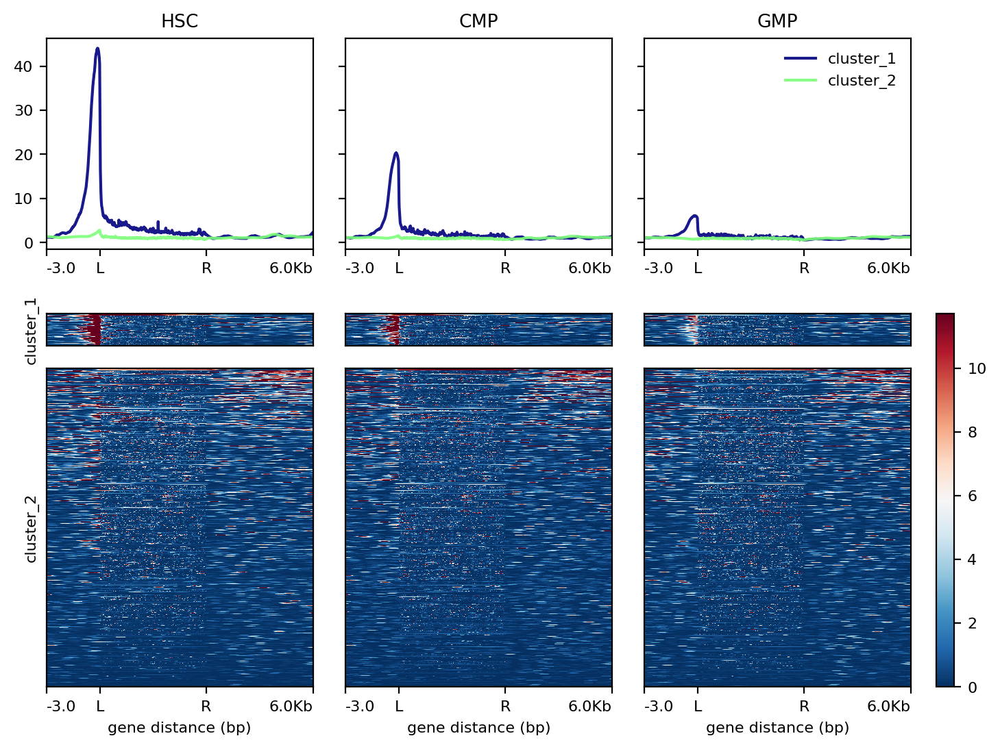

In [134]:
cl = fread('~/WenhuoHu/collab_Farhan/cluster.tsv') 
cl = cl[cluster == 1, ]
cl[, class_id := unlist(strsplit(.SD$gene, ':'))[3], by = 1:nrow(cl) ]
cl[, family_id := unlist(strsplit(.SD$gene, ':'))[2], by = 1:nrow(cl) ]
cl[, gene_id := unlist(strsplit(.SD$gene, ':'))[1], by = 1:nrow(cl) ]
tmp = ann[ anno != 'Distal'  & class_id %in% c('LINE') & family_id %in% cl$family_id & gene_id %in% cl$gene_id, ]
dim(tmp) 
tmp = tmp[!duplicated(geneId),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, geneStart, geneEnd, name, geneId, geneStrand2)], file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("singularity exec /home/whu78/images/depot.galaxyproject.org-singularity-deeptools-3.5.5--pyhdfd78af_0.img computeMatrix scale-regions -S ")
cmd1 = paste0(cmd1, paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' singularity exec /home/whu78/images/depot.galaxyproject.org-singularity-deeptools-3.5.5--pyhdfd78af_0.img ')
cmd2 = paste0(cmd2, ' plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions TE_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

write(cmd1, file = 'run.sh', append = T)
write(cmd2, file = 'run.sh', append = T)

tmp = fread('TE_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')



cluster_1 cluster_2 
       44       333 

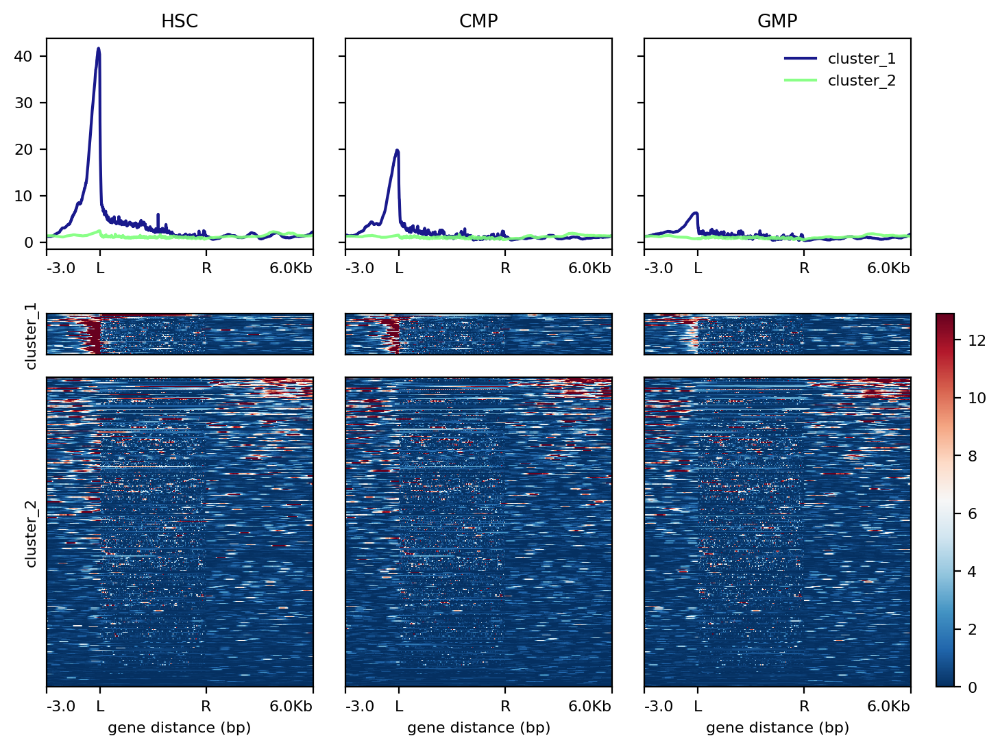

In [135]:

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("singularity exec /home/whu78/images/depot.galaxyproject.org-singularity-deeptools-3.5.5--pyhdfd78af_0.img computeMatrix scale-regions -S ")
cmd1 = paste0(cmd1, paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' singularity exec /home/whu78/images/depot.galaxyproject.org-singularity-deeptools-3.5.5--pyhdfd78af_0.img ')
cmd2 = paste0(cmd2, ' plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions TE_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

write(cmd1, file = 'run.sh', append = T)
write(cmd2, file = 'run.sh', append = T)

tmp = fread('TE_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


In [138]:
bed = fread('TE_generegion_cluster.bed')
bed2 = ann[name %in% bed[deepTools_group == 'cluster_1', name] & anno != 'Distal', ]
#bed2 = bed2[abs(distanceToTSS) < 10000, .(anno, name, start, end, geneStart, geneEnd, geneId)  ][!duplicated(name), ]
bed2 = bed2[anno == 'Intron', .(anno, name, start, end, geneStart, geneEnd, geneId)  ][!duplicated(name),  ]
datatable(bed2)

HTML widgets cannot be represented in plain text (need html)

In [127]:
c('PRMT9', 'LINS1', 'FKTN')


    Distal Downstream       Exon     Intron   Promoter       UTR3       UTR5 
     83656         90       1077      80738      11625        673        283 

In [117]:
head(ann$name)

[1] "Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA"
[2] "Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA"
[3] "Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA"
[4] "Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA"
[5] "Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA"
[6] "Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA"

In [85]:
head(ann[, .(seqnames, anno, start, end, strand, geneStart, geneEnd, name, geneId, geneStrand2)]) 

seqnames,anno,start,end,strand,geneStart,geneEnd,name,geneId,geneStrand2
<fct>,<chr>,<int>,<int>,<chr>,<int>,<int>,<chr>,<chr>,<chr>
chr2,Intron,231246748,231246957,-,231207856,231208566,Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,BANF1P3,-
chr2,Intron,231246748,231246957,-,231207856,231208566,Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,BANF1P3,-
chr2,Intron,231246748,231246957,-,231207856,231208566,Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,BANF1P3,-
chr2,Intron,231247632,231248114,-,231207856,231208566,Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,BANF1P3,-
chr2,Intron,231247632,231248114,-,231207856,231208566,Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,BANF1P3,-
chr2,Intron,231247632,231248114,-,231207856,231208566,Charlie1_dup1400:Charlie1a:hAT-Charlie:DNA,BANF1P3,-


[1] 2131   21

[1] 923  21

[1] "923"


cluster_1 cluster_2 
       89       834 

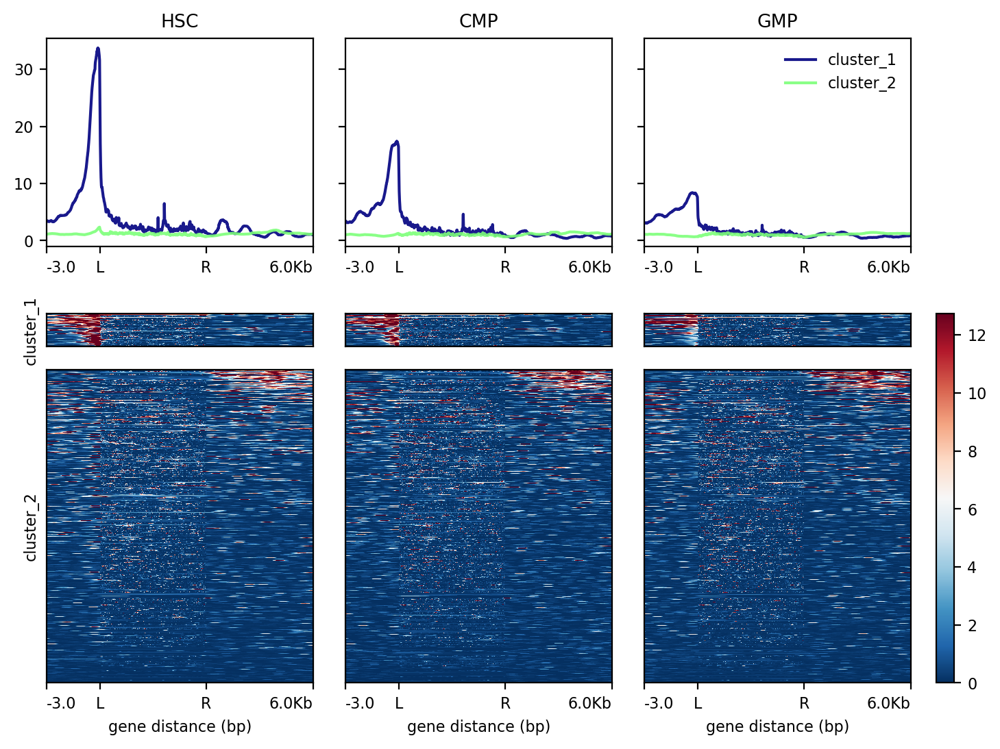

In [278]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR', 'DNA') & width > 3000,] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[!duplicated(geneId),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, geneStart, geneEnd, name, geneId, geneStrand2)], file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions TE_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

write(cmd1, file = 'run.sh', append = T)
write(cmd2, file = 'run.sh', append = T)

tmp = fread('TE_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 94486    21

[1] 6184   21

[1] "6184"

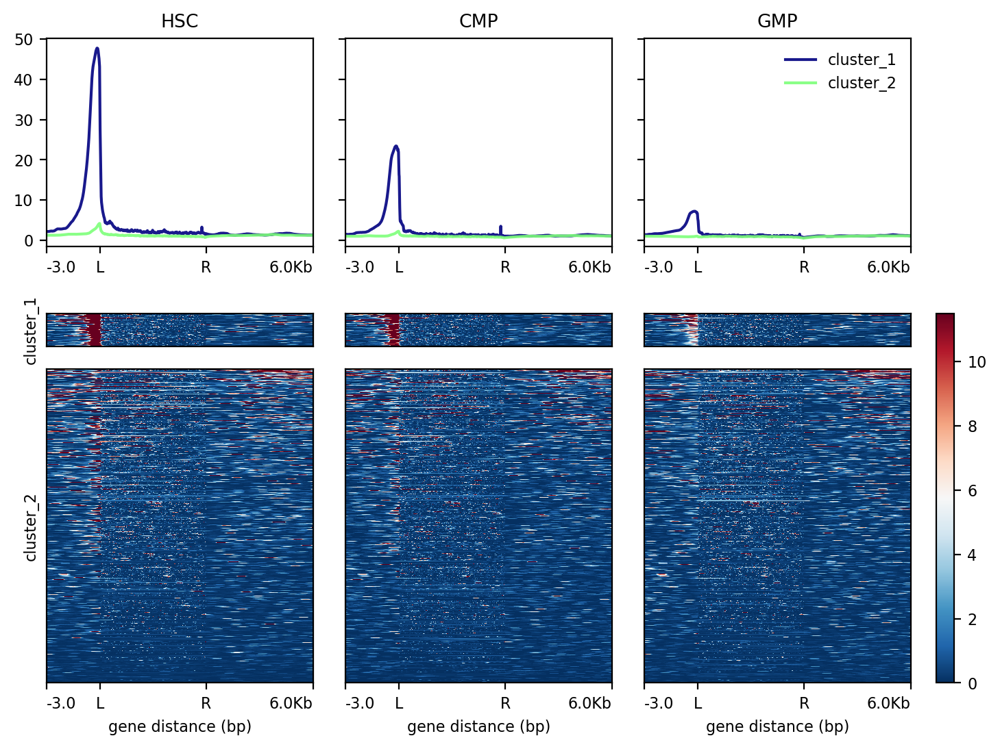

In [191]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR', 'DNA'),] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[!duplicated(geneId),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, geneStart, geneEnd, name, geneId, geneStrand2)], file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions TE_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

write(cmd1, file = 'run.sh', append = T)
write(cmd2, file = 'run.sh', append = T)

tmp = fread('TE_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 82704    22

[1] 3973   22

[1] "3973"


cluster_1 cluster_2 
      449      3524 

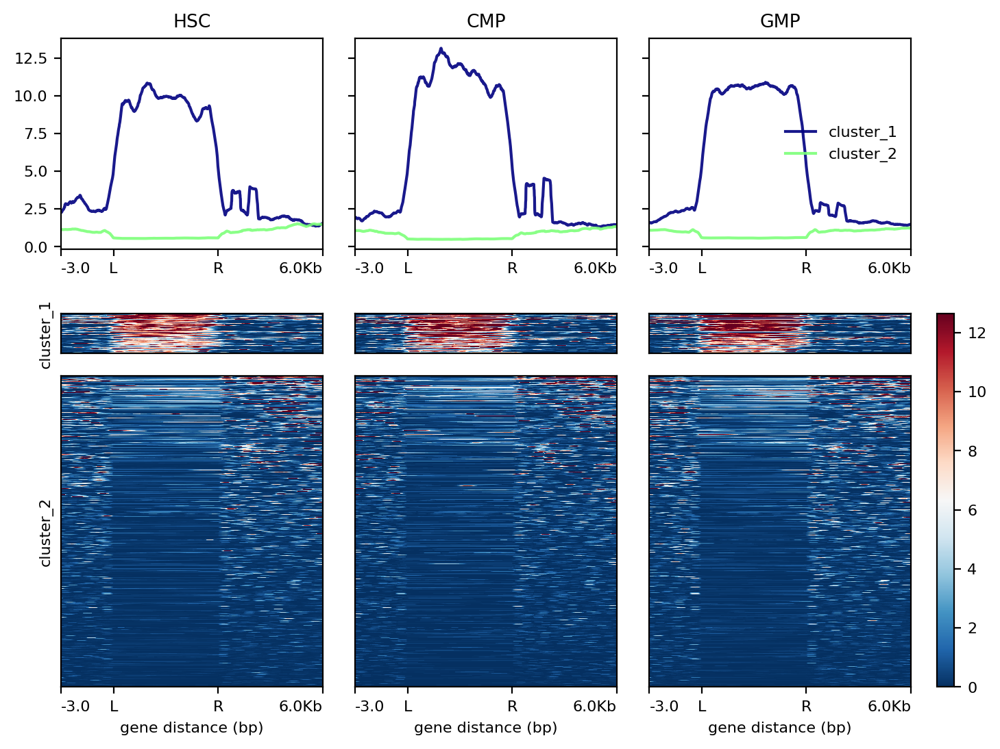

In [83]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
tmp = ann[anno == 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[!duplicated(geneId),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, start, end, name, geneId, geneStrand2)], file = 'cmp_te_region.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('~/conda3/envs/nov24/bin/sort-bed cmp_te_region.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/nov24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/nov24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions LINELTR_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('LINELTR_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 91246    22

[1] 5582   22

[1] "5582"

Warning message in system(cmd1, wait = T):
“error in running command”
Warning message in system(cmd2, wait = T):
“error in running command”



cluster_1 cluster_2 
      449      3524 

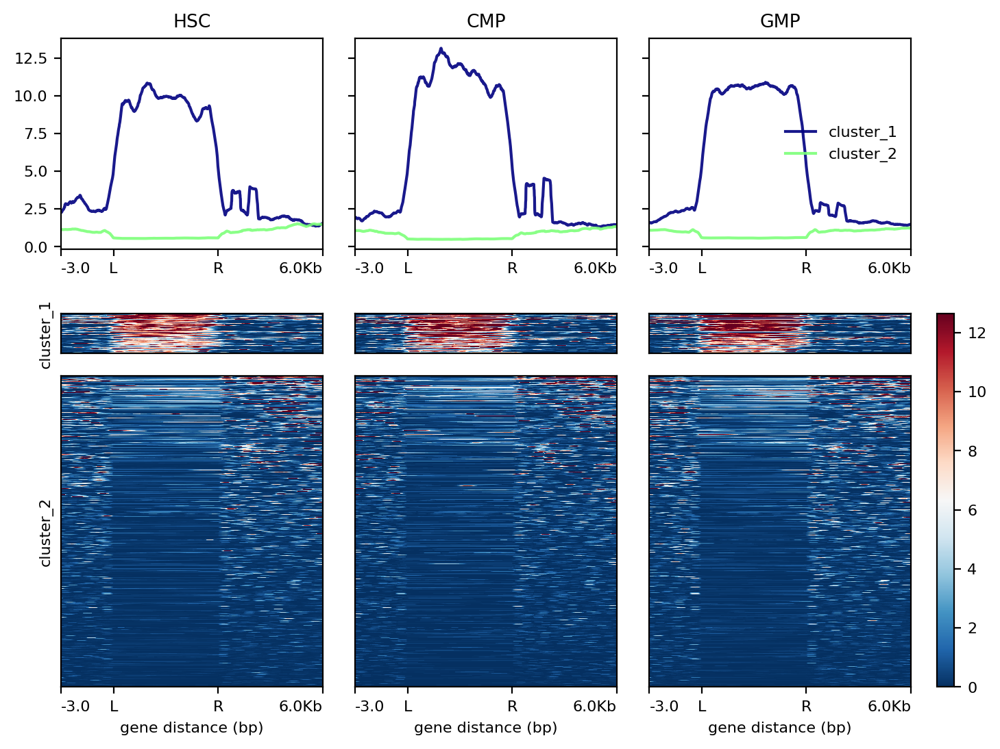

In [84]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[!duplicated(geneId),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, start, end, name, geneId, geneStrand2)], file = 'cmp_te_AnnoGene_teRegion.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('~/conda3/envs/nov24/bin/sort-bed cmp_te_AnnoGene_teRegion.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions LINELTR_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('LINELTR_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 91246    21

[1] 5582   21

[1] "5582"


cluster_1 cluster_2 
      530      5052 

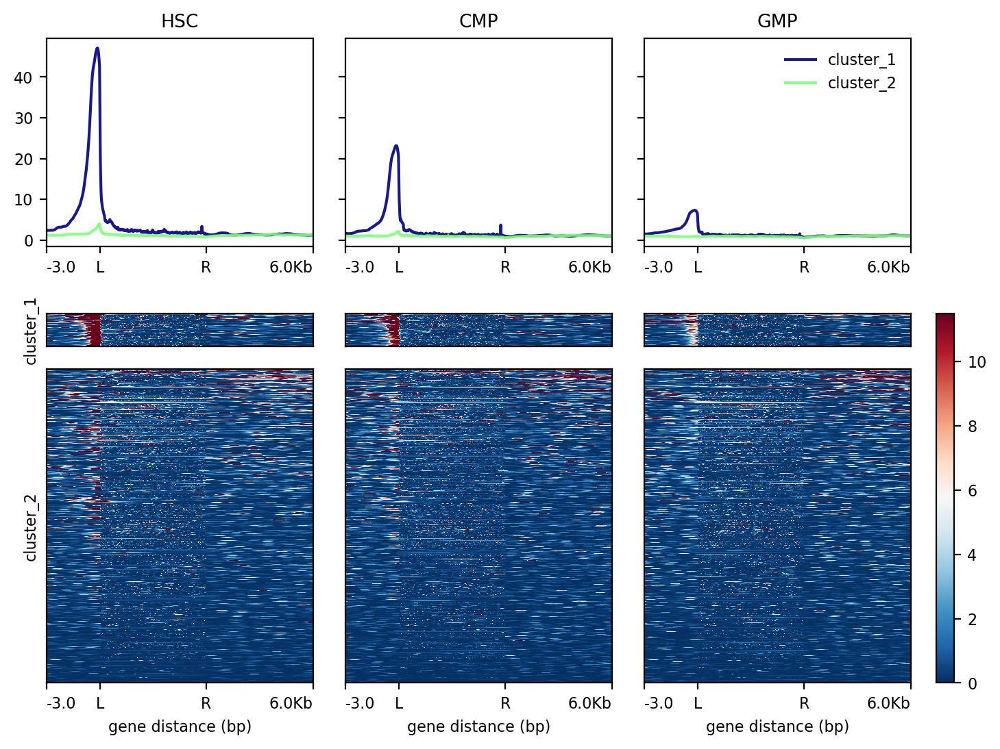

In [194]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[!duplicated(geneId),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, geneStart, geneEnd, name, geneId, geneStrand2)], file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('~/conda3/envs/nov24/bin/sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions LINELTR_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('LINELTR_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 3240   21

[1] 976  21

[1] "976"


cluster_1 cluster_2 
      107       869 

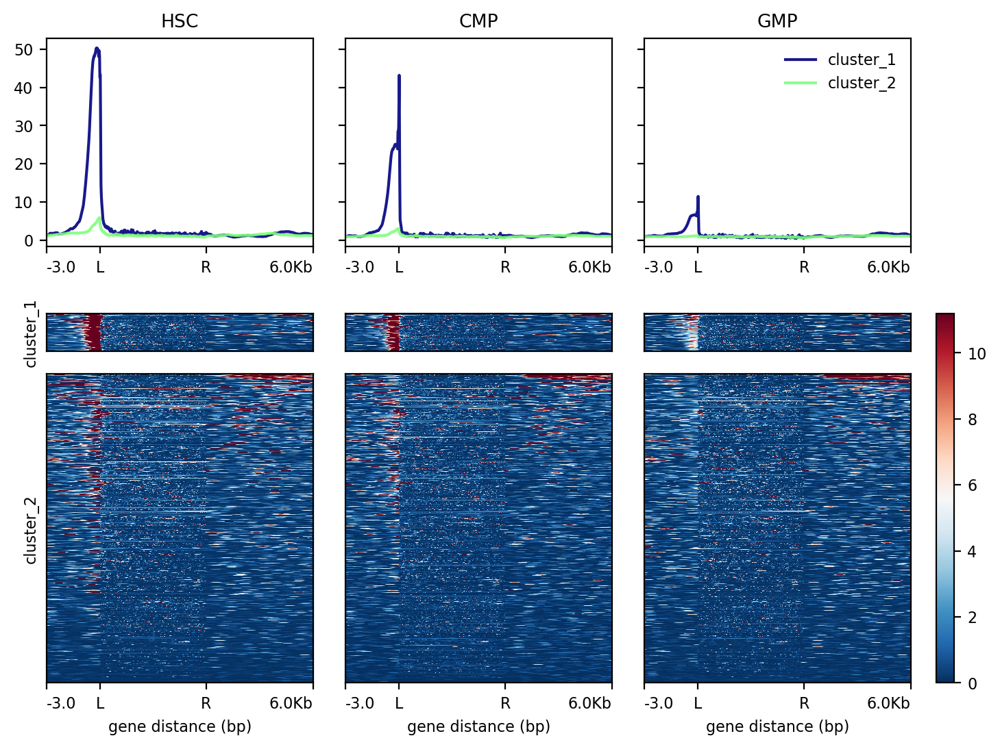

In [209]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[!duplicated(geneId),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, geneStart, geneEnd, name, geneId, geneStrand2)], file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions DNA_generegion_cluster.bed.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('DNA_generegion_cluster.bed.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


## TE region activities in ATAC-Seq 

In [217]:
table(ann$class_id)


   DNA   LINE    LTR 
  4192 149611  24339 

In [239]:
head(deg_MEPCMP[logFC < -2 & FDR < .05 & batch == 'CMP' & target == 'HSC', ])
dim( deg_MEPCMP[logFC < -2 & FDR < .05 & batch == 'CMP' & target == 'HSC', ])

.id,rn,logFC,logCPM,PValue,FDR,batch,target,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>
deg_CMP_HSC,MER92D:ERV1:LTR,-12.146534,4.180275,3.142438e-09,1.902921e-07,CMP,HSC,LTR,ERV1,MER92D
deg_CMP_HSC,LTR53B:ERVL:LTR,-12.110903,4.144844,6.639166e-09,3.435240e-07,CMP,HSC,LTR,ERVL,LTR53B
deg_CMP_HSC,L1P3b:L1:LINE,-11.938692,3.975489,8.209158e-09,3.890427e-07,CMP,HSC,LINE,L1,L1P3b
deg_CMP_HSC,LTR35B:ERV1:LTR,-7.928638,4.410247,1.498479e-08,6.282086e-07,CMP,HSC,LTR,ERV1,LTR35B
deg_CMP_HSC,Eulor8:TcMar:DNA,-12.096150,4.130071,2.023253e-08,8.167949e-07,CMP,HSC,DNA,TcMar,Eulor8
deg_CMP_HSC,LTR1B0:ERV1:LTR,-11.665567,3.707396,3.714629e-08,1.446052e-06,CMP,HSC,LTR,ERV1,LTR1B0


[1] 51 11

[1] 82704    22

[1] 10425    22

[1] "10425"


cluster_1 cluster_2 
     1127      9298 

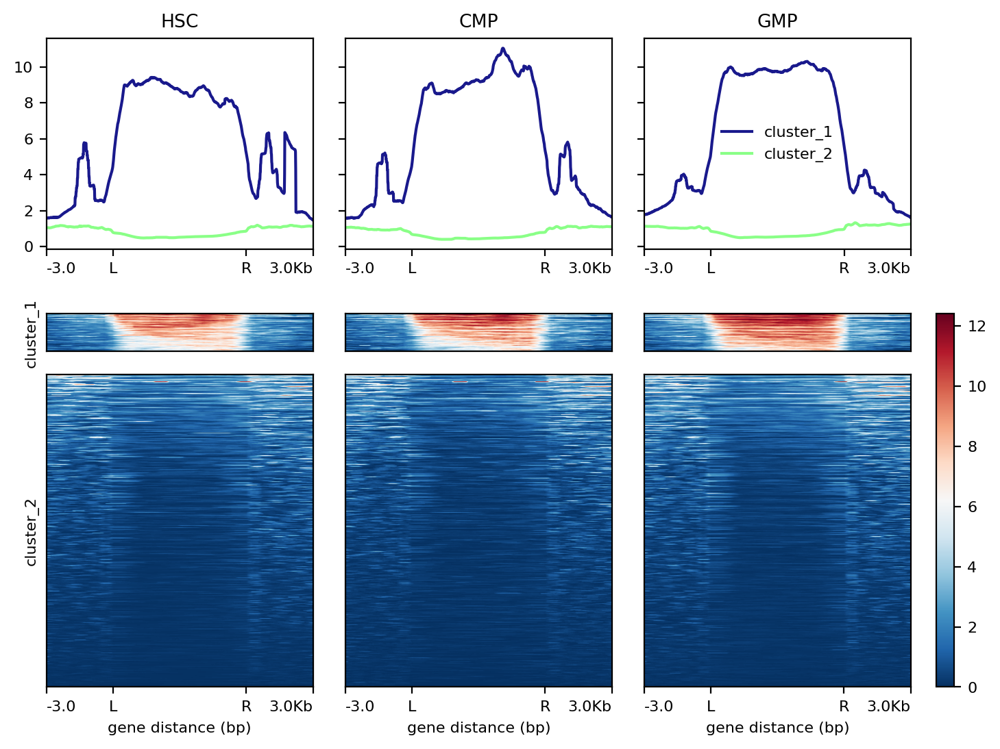

In [86]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
tmp = ann[anno == 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
#tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[width > 1500, ]
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('~/conda3/envs/nov24/bin/sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/nov24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 3000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/nov24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions LINELTR_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('LINELTR_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 82704    22

[1] 10425    22

[1] "10425"

Warning message in system("grep -c \"\" cmp_te_sorted_merged.bed", intern = T):
“running command 'grep -c "" cmp_te_sorted_merged.bed' had status 1”


[1] "0"
attr(,"status")
[1] 1
attr(,"errmsg")
[1] "Resource temporarily unavailable"


cluster_1 cluster_2 
     1127      9298 

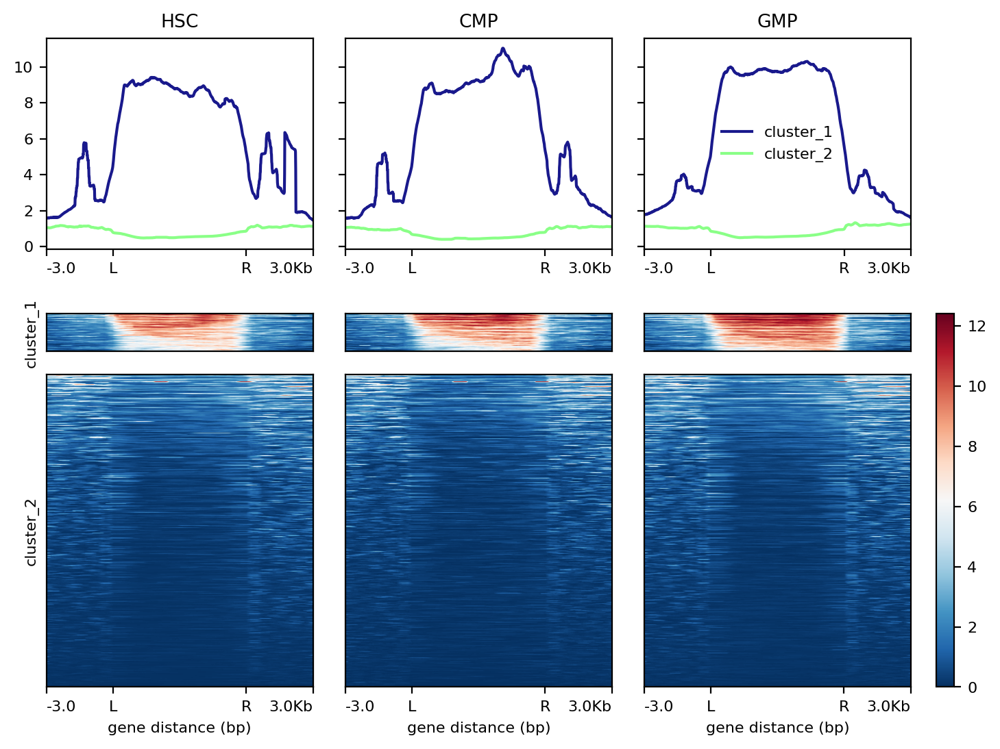

In [79]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
tmp = ann[anno == 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
#tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[width > 1500, ]
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('~/conda3/envs/nov24/bin/sort-bed cmp_te.bed > cmp_te_sorted.bed') 
system('~/conda3/envs/nov24/bin/bedops -me cmp_te_sorted.bed > cmp_te_sorted_merged.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)
system('grep -c "" cmp_te_sorted_merged.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/nov24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 3000 -b 3000 -R cmp_te_sorted_merged.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/nov24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions LINELTR_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('LINELTR_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 91246    22

[1] 8638   22

[1] "8638"


cluster_1 cluster_2 
     1247      7391 

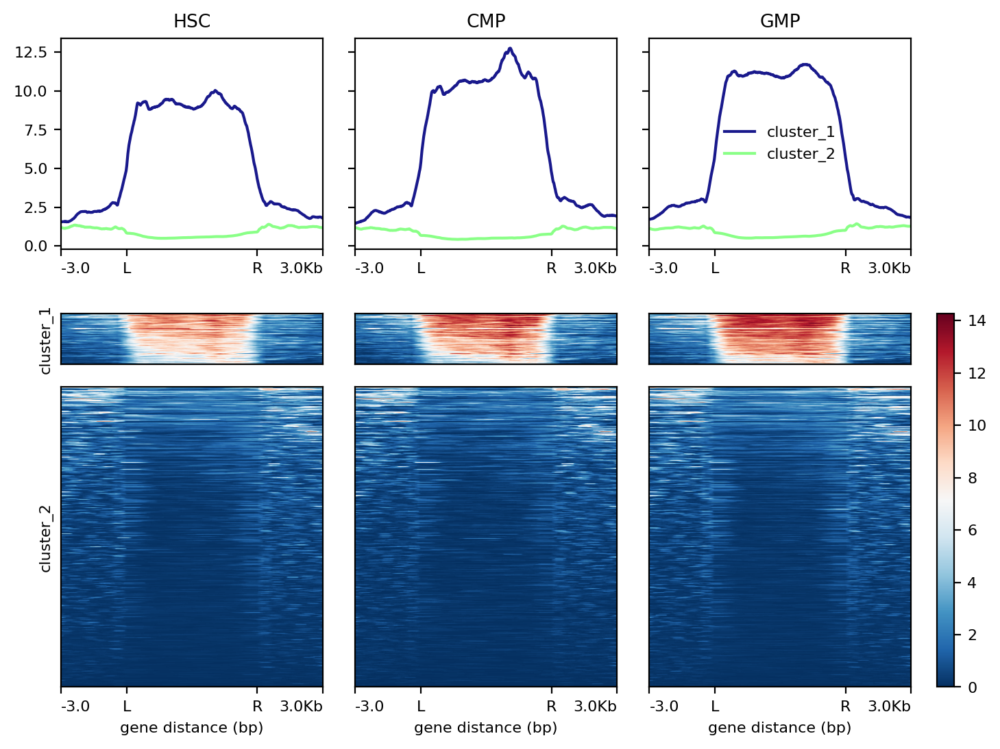

In [77]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
#tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[width > 1500, ]
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('~/conda3/envs/nov24/bin/sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/nov24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 3000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/nov24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions LINELTR_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('LINELTR_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 3240   21

[1] 535  21

[1] "535"


cluster_1 cluster_2 
       41       494 

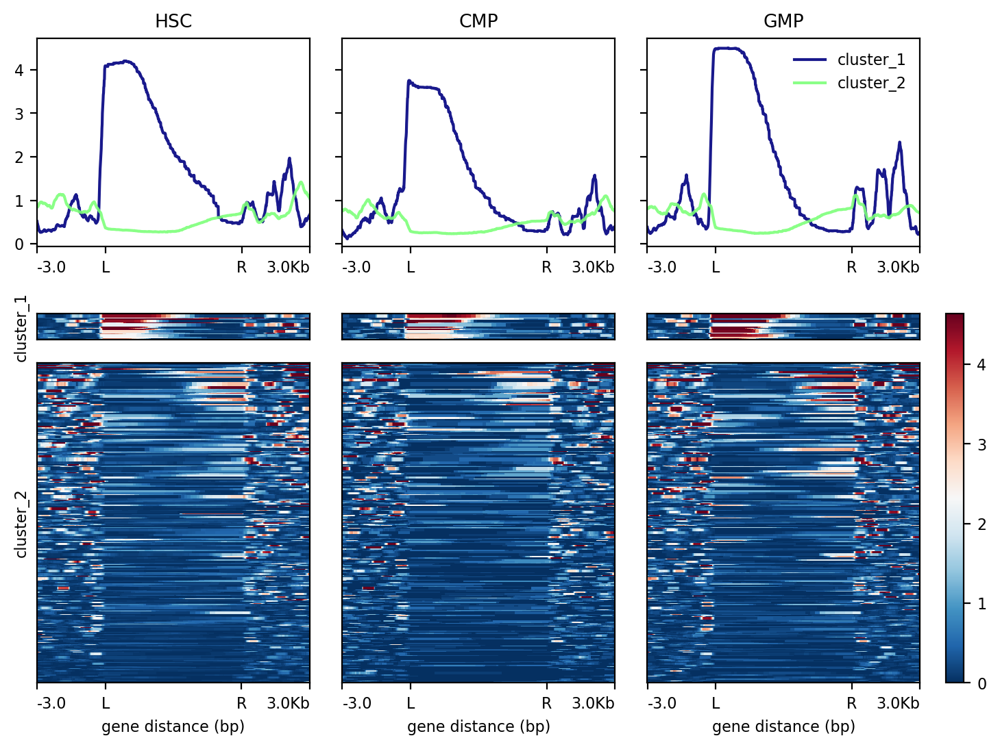

In [230]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 
tmp = tmp[width > 500, ]
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 3000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions DNA_generegion_cluster.bed.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('DNA_generegion_cluster.bed.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 3240   21

[1] "3240"


cluster_1 cluster_2 
      605      2635 

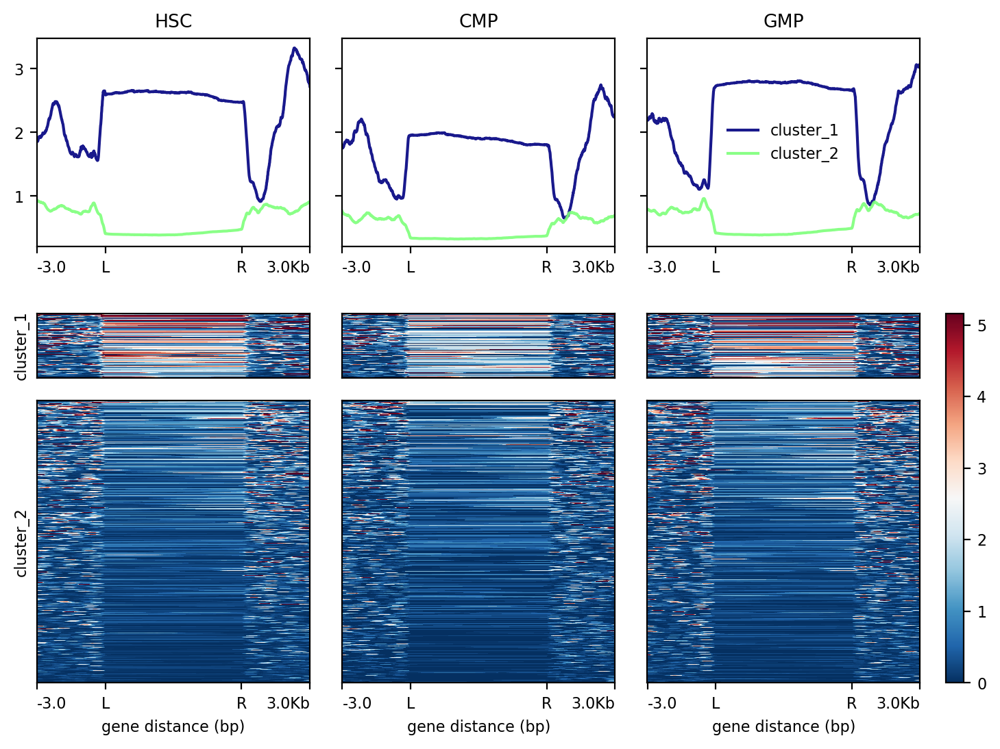

In [231]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 3000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions DNA_generegion_cluster.bed.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('DNA_generegion_cluster.bed.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 606  21

[1] "606"


cluster_1 cluster_2 
      291       315 

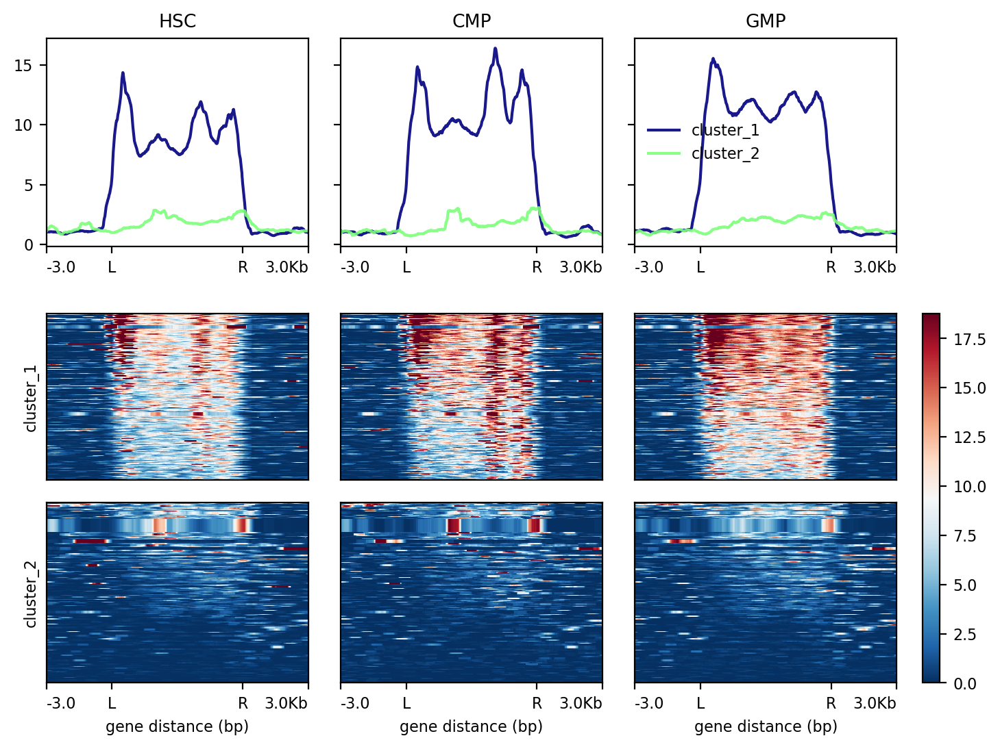

In [240]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
tmp = ann[anno == 'Distal' &  class_id %in% c('LINE', 'LTR') & width > 5000,] 
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 3000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions DNA_generegion_cluster.bed.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('DNA_generegion_cluster.bed.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 606  21

[1] "606"


cluster_1 cluster_2 
      286       320 

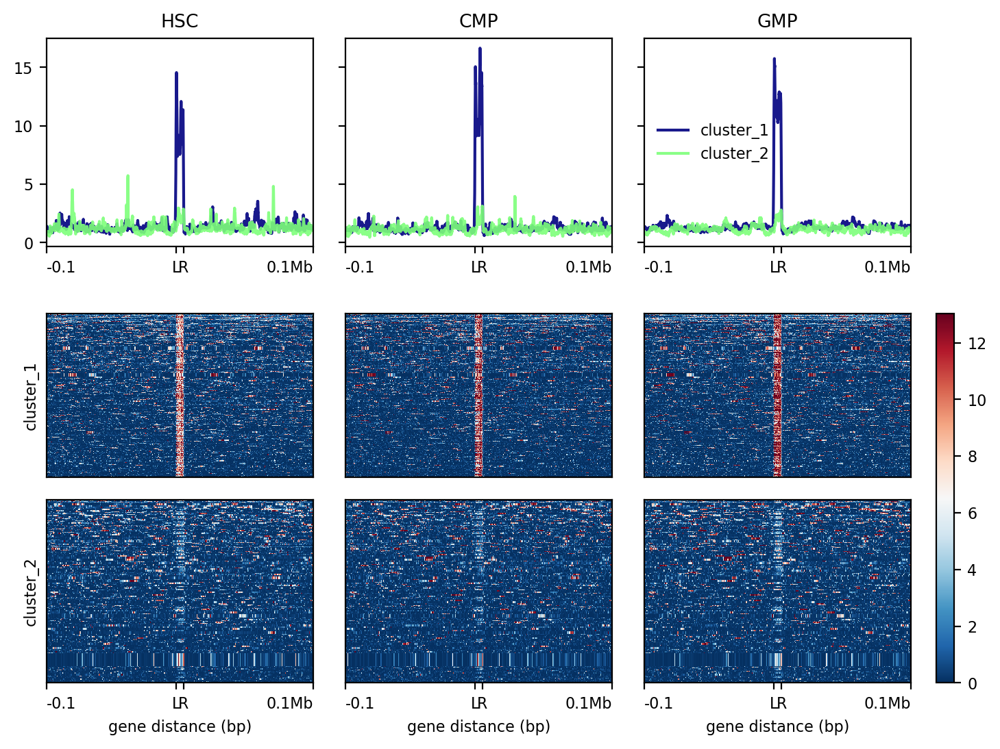

In [252]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
tmp = ann[anno == 'Distal' &  class_id %in% c('LINE', 'LTR') & width > 5000,] 
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 100000 -b 100000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions DNA_generegion_cluster.bed.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('DNA_generegion_cluster.bed.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 576  21

[1] "576"


cluster_1 
      576 

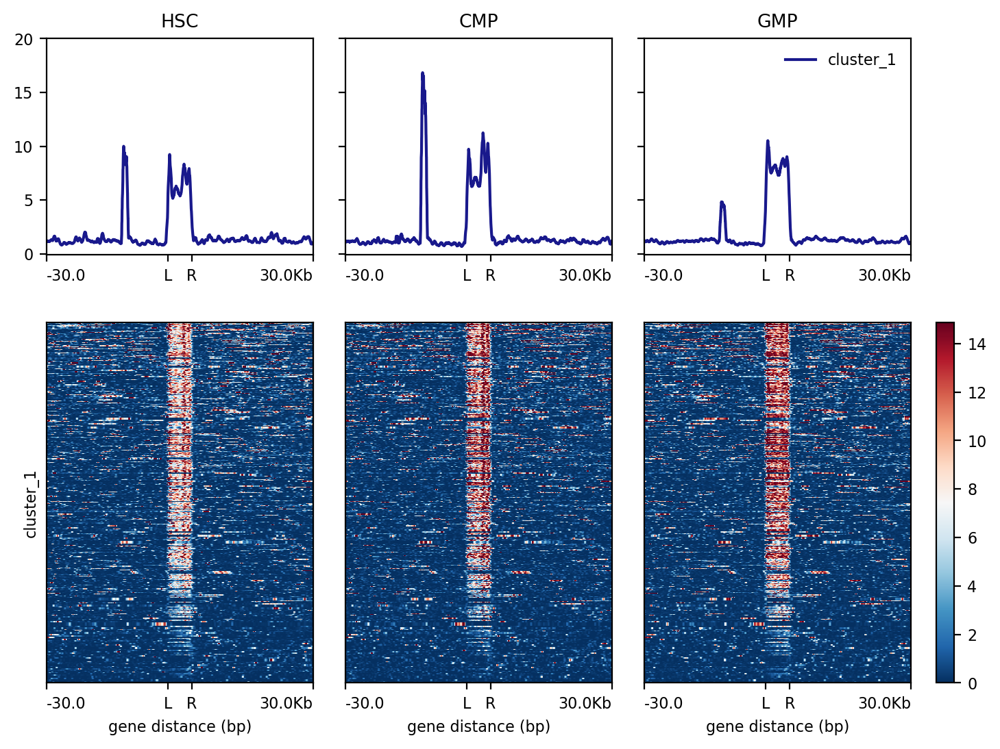

In [251]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR') & width > 5000,] 
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 30000 -b 30000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --yMax 20 --heatmapHeight 10 --heatmapWidth 6 --kmeans 1 --outFileSortedRegions DNA_generegion_cluster.bed.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('DNA_generegion_cluster.bed.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 576  21

[1] "576"


cluster_1 cluster_2 
      354       222 

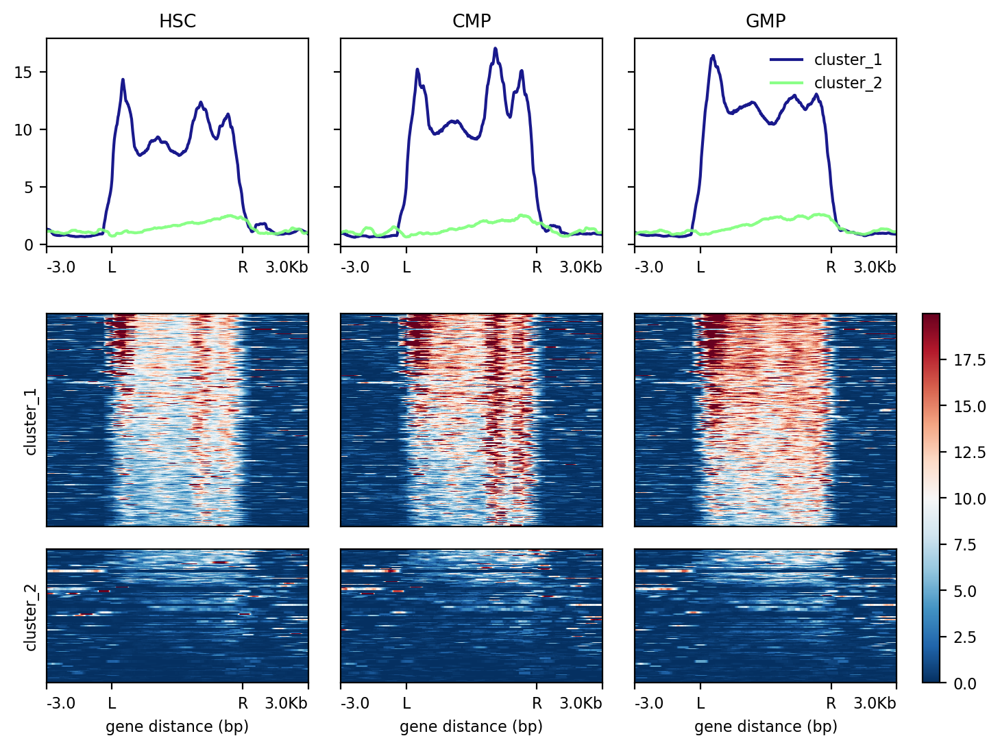

In [241]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR') & width > 5000,] 
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 3000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions DNA_generegion_cluster.bed.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('DNA_generegion_cluster.bed.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 91246    21

[1] "91246"


cluster_1 cluster_2 
     4207     87039 

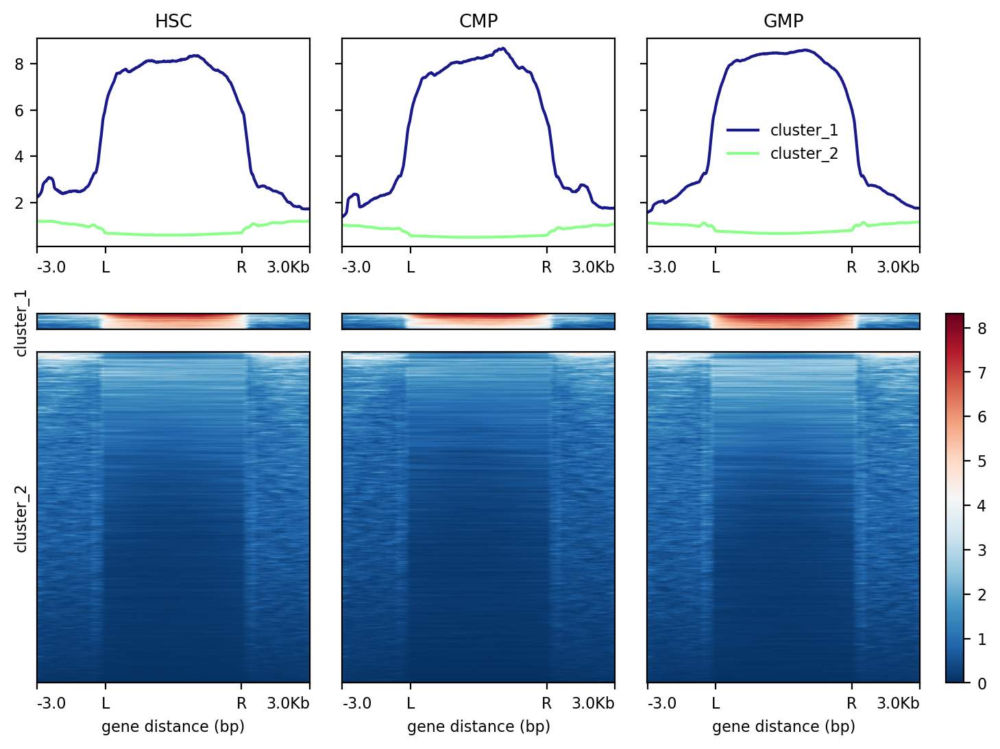

In [242]:
# export DEG TE regions
# tmp = ann[anno != 'Distal' & !duplicated(geneId) & class_id == 'DNA', .(seqnames, geneStart, geneEnd, geneId, name, strand)] 
# tmp = ann[grepl('intron 1 of', annotation) &  class_id == 'DNA',] 
# tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR') & width > 0,] 
dim(tmp) 

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)] , file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 3000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions DNA_generegion_cluster.bed.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('DNA_generegion_cluster.bed.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 952  21

[1] "952"


cluster_1 cluster_2 
      296       656 

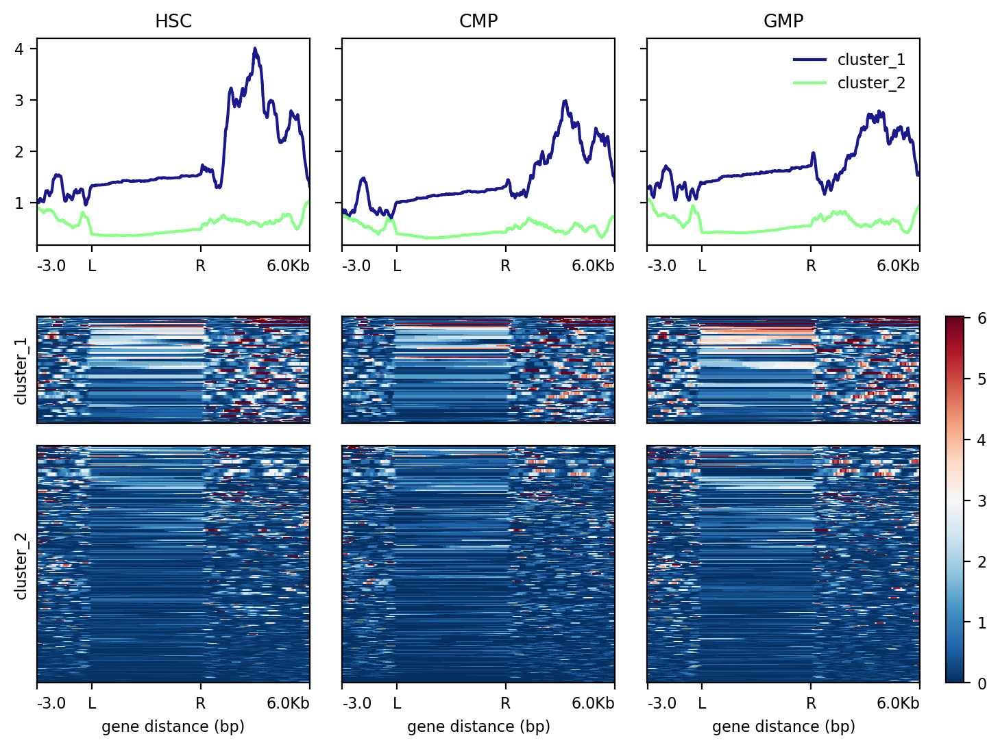

In [205]:
# export DEG TE regions
tmp = ann[anno == 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)], file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions Distal_Retro_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('Distal_Retro_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 3240   21

[1] "3240"


cluster_1 cluster_2 
      492      2748 

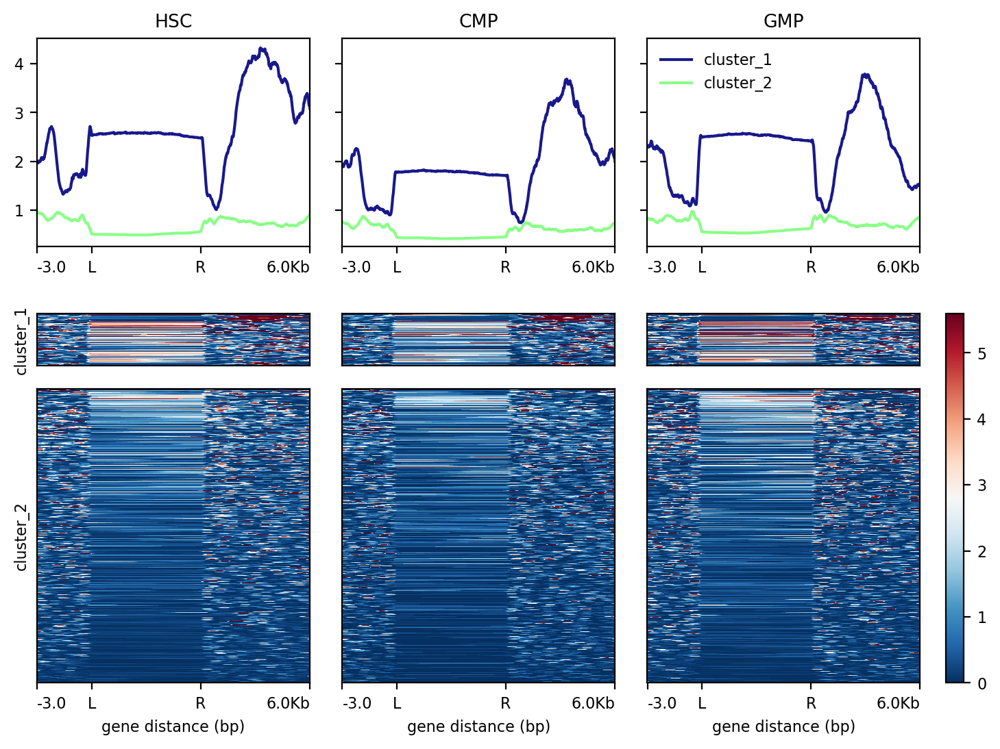

In [206]:
# export DEG TE regions
tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)], file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions Distal_Retro_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('Distal_Retro_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 5582   21

[1] "5582"


cluster_1 cluster_2 
      544      5038 

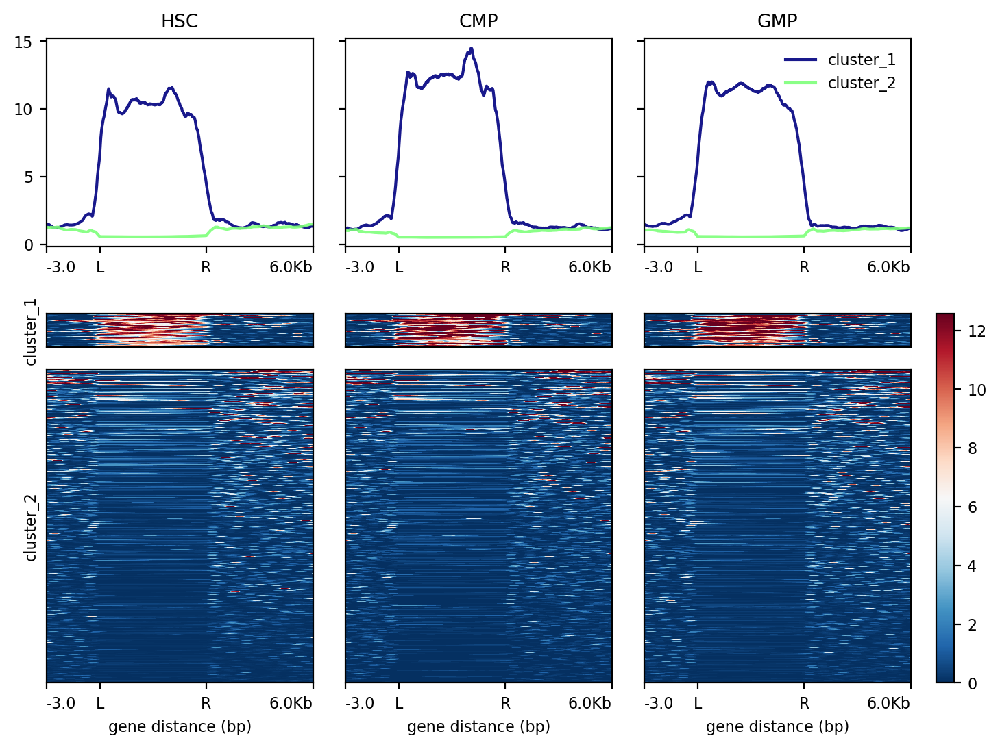

In [202]:
# export DEG TE regions
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)], file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions Distal_Retro_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('Distal_Retro_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


[1] 3973   21

[1] "3973"


cluster_1 cluster_2 
      443      3530 

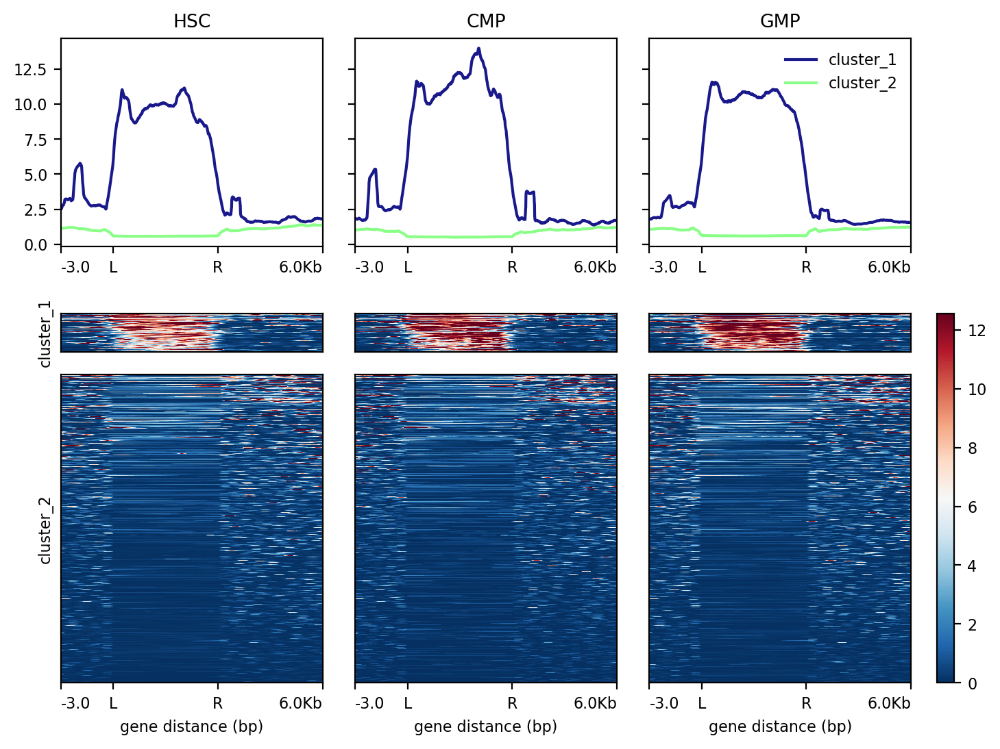

In [201]:
# export DEG TE regions
tmp = ann[anno == 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
dim(tmp)

fwrite(tmp[,  .(seqnames, start, end, name, geneId, strand)], file = 'cmp_te.bed', sep = '\t', col.names = F)

system('rm cmp_te_sorted.bed')
system('sort-bed cmp_te.bed > cmp_te_sorted.bed') 

#system('rm atac_peak_around_te.bed')
#system('bedops --element-of 1 hsc_atac_concensus.bed cmp_te_sorted.bed > atac_peak_around_te.bed')

system('grep -c "" cmp_te_sorted.bed', intern = T)

# find ATAC Seq peaks around these TE regions
cmd1 = paste0("~/conda3/envs/feb24/bin/computeMatrix scale-regions -S ", paste(dsn_sel2$bigwig_file, collapse = ' '))
cmd1 = paste0(cmd1, ' -a 6000 -b 3000 -R cmp_te_sorted.bed  --skipZeros --regionBodyLength 6000 ')
cmd1 = paste0(cmd1, ' --samplesLabel ', paste(dsn_sel2$cell_type, collapse = ' '), ' -o matrxi_te_ext10k_atac.gz -p 10 ')
system(cmd1, wait = T)

# examine the peaks for these regions
cmd2 = paste0(' ~/conda3/envs/feb24/bin/plotHeatmap -m matrxi_te_ext10k_atac.gz -out plot/te_ext10k_atac --startLabel L --endLabel R ')
cmd2 = paste0(cmd2, ' --colorMap RdBu_r  --heatmapHeight 10 --heatmapWidth 6 --kmeans 2 --outFileSortedRegions Distal_Retro_generegion_cluster.bed --outFileNameMatrix b.gz')
system(cmd2, wait = T)

tmp = fread('Distal_Retro_generegion_cluster.bed')
table(tmp$deepTools_group)

IRdisplay::display_png(file = 'plot/te_ext10k_atac.png')


## the orientation of these genes and the associated DNA or LINE/LTR TEs

In [196]:
retro_cl = fread('LINELTR_generegion_cluster.bed')
dna_cl = fread('DNA_generegion_cluster.bed.bed')


In [197]:
table(dna_cl$deepTools_group)
table(retro_cl$deepTools_group)


cluster_1 cluster_2 
      107       869 


cluster_1 cluster_2 
      530      5052 

[1] 5582   23


	Pearson's Chi-squared test with Yates' continuity correction

data:  table(tmp$deepTools_group, tmp$orient)
X-squared = 3.1637, df = 1, p-value = 0.07529


Warning message:
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(tmp$deepTools_group, tmp$orient)). In the next version, this warning will become an error."


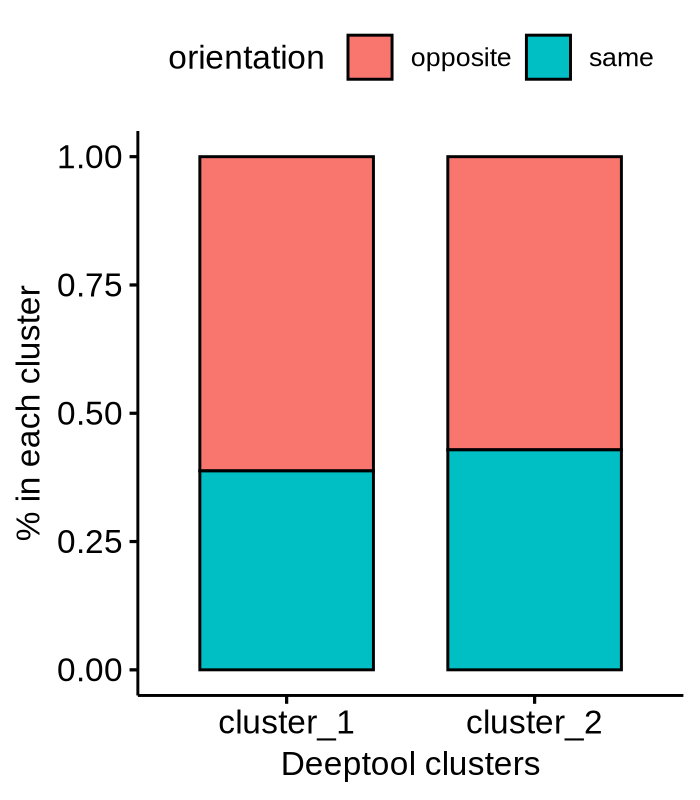

In [198]:
tmp = ann[anno != 'Distal' &  class_id %in% c('LINE', 'LTR'),] 
tmp = tmp[!duplicated(geneId),] 
tmp = merge(tmp, retro_cl[, .(name, deepTools_group)] , by = 'name') 
tmp[, orient := as.character(geneStrand2 == strand )]
dim(tmp)
chisq.test(table(tmp$deepTools_group, tmp$orient))
plotdat = as.data.table(melt(table(tmp$deepTools_group, tmp$orient)))
plotdat[, nn := sum(.SD$value), by = 'Var1'] 
plotdat[, per := value / nn ]
plotdat[, orientation := ifelse(Var2 == TRUE, 'same', 'opposite')]
#ggbarplot(plotdat, x = 'Var1', y = 'value', fill = 'Var2', position = position_dodge(0.8))
options(repr.plot.width = 3.5, repr.plot.height = 4, repr.plot.res = 200)
ggbarplot(plotdat, x = 'Var1', y = 'per', fill = 'orientation') + xlab('Deeptool clusters') + ylab('% in each cluster') 


[1] 976  23


	Pearson's Chi-squared test with Yates' continuity correction

data:  table(tmp$deepTools_group, tmp$orient)
X-squared = 1.476, df = 1, p-value = 0.2244


Warning message:
"The melt generic in data.table has been passed a table and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(table(tmp$deepTools_group, tmp$orient)). In the next version, this warning will become an error."


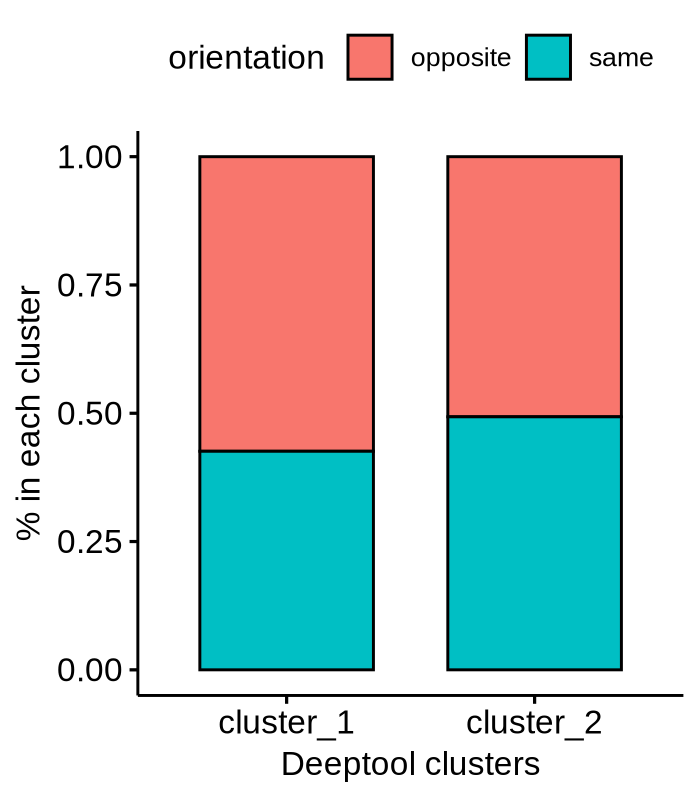

In [199]:
tmp = ann[anno != 'Distal' &  class_id %in% c('DNA'),] 
tmp = tmp[!duplicated(geneId),] 
tmp = merge(tmp, dna_cl[, .(name, deepTools_group)] , by = 'name') 
tmp[, orient := as.character(geneStrand2 == strand )]
dim(tmp)
chisq.test(table(tmp$deepTools_group, tmp$orient))
plotdat = as.data.table(melt(table(tmp$deepTools_group, tmp$orient)))
plotdat[, nn := sum(.SD$value), by = 'Var1'] 
plotdat[, per := value / nn ]
plotdat[, orientation := ifelse(Var2 == TRUE, 'same', 'opposite')]
#ggbarplot(plotdat, x = 'Var1', y = 'value', fill = 'Var2', position = position_dodge(0.8))
options(repr.plot.width = 3.5, repr.plot.height = 4, repr.plot.res = 200)
ggbarplot(plotdat, x = 'Var1', y = 'per', fill = 'orientation') + xlab('Deeptool clusters') + ylab('% in each cluster') 


## what are these host genes

In [261]:
library(gprofiler2)

In [279]:
tmp = fread('TE_generegion_cluster.bed')
gs_cluster1 = unique(ann[name %in% tmp[deepTools_group == 'cluster_1', name], geneId])
gs_cluster2 = unique(ann[name %in% tmp[deepTools_group == 'cluster_2', name], geneId])
gs = unique(ann[name %in% tmp[, name], geneId])
length(gs_cluster1)
length(gs)

[1] 92

[1] 948

In [282]:
prof = gost(query = gs, organism = 'hsapiens') 
prof_res = as.data.table(prof$result) 
prof_res = prof_res[order(p_value), ]
dim(prof_res[significant == T, ])
table(prof_res$source)
(prof_res[significant == T, ])

[1] 107  14


GO:BP GO:CC GO:MF  REAC    TF 
   17    19     1     2    68 

query,significant,p_value,term_size,query_size,intersection_size,precision,recall,term_id,source,term_name,effective_domain_size,source_order,parents
<chr>,<lgl>,<dbl>,<int>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<int>,<int>,<list>
query_1,TRUE,3.018933e-08,11734,371,279,0.7520216,0.02377706,TF:M01230_1,TF,Factor: ZNF333; motif: ATAAT; match class: 1,20045,10175,TF:M01230
query_1,TRUE,5.605065e-07,3532,371,115,0.3099730,0.03255946,TF:M02115,TF,Factor: Prx2; motif: TYAWAKTAA,20045,7114,TF:M00000
query_1,TRUE,5.625640e-07,7073,371,190,0.5121294,0.02686272,TF:M03813_1,TF,Factor: BRN1; motif: HAATGCN; match class: 1,20045,611,TF:M03813
query_1,TRUE,6.650959e-07,5943,371,167,0.4501348,0.02810029,TF:M00672,TF,Factor: TEF; motif: ATGTTWAYATAA,20045,8668,TF:M00000
query_1,TRUE,1.155554e-06,6228,372,157,0.4220430,0.02520873,GO:0071944,GO:CC,cell periphery,22097,2793,GO:0110165
query_1,TRUE,3.332762e-06,9864,372,220,0.5913978,0.02230333,GO:0016020,GO:CC,membrane,22097,720,GO:0110165
query_1,TRUE,3.541842e-06,11997,371,277,0.7466307,0.02308911,TF:M02097,TF,Factor: LHX3; motif: ATTAAW,20045,4764,TF:M00000
query_1,TRUE,3.667556e-06,5742,372,146,0.3924731,0.02542668,GO:0005886,GO:CC,plasma membrane,22097,422,GO:00160....
query_1,TRUE,4.613411e-06,2389,372,77,0.2069892,0.03223106,GO:0042995,GO:CC,cell projection,22097,1845,GO:0110165


In [263]:
gostplot(prof)

Warning message in fun(pkgname, pkgpath):
"internal error 1 in R_decompress1 with libdeflate"


Error in fun(pkgname, pkgpath) : 
  lazy-load database '/research/rgs01/home/clusterHome/whu78/conda3/envs/aug24/lib/R/library/htmlwidgets/R/htmlwidgets.rdb' is corrupt


Warning message in model$key():
"internal error 1 in R_decompress1 with libdeflate"


ERROR: Error in model$key(): lazy-load database '/research/rgs01/home/clusterHome/whu78/conda3/envs/aug24/lib/R/library/lazyeval/R/lazyeval.rdb' is corrupt


In [256]:
yy = enrichGO(gs, OrgDb = org.Hs.eg.db, keyType = 'SYMBOL', ont="BP", pvalueCutoff=0.01)


ERROR: Error in eval(expr, envir, enclos): object 'gs' not found


In [ ]:
enrichGO(

In [260]:
dim(path[grep('human', pathway), ])

[1] 339   4

In [259]:
path = fread('../workspace/CPDB_pathways_genes.tab')
dim(path)
head(path)

[1] 4681    4

pathway,external_id,source,hgnc_symbol_ids
<chr>,<chr>,<chr>,<chr>
"Alanine, aspartate and glutamate metabolism - Homo sapiens (human)",path:hsa00250,KEGG,"NIT2,ASNS,GLUL,ABAT,ADSL,GLS,ASS1,GAD1,GAD2,CAD,ASPA,GOT2,ASRGL1,GOT1,ASL,RIMKLA,RIMKLB,DDO,GFPT1,GPT,ALDH4A1,AGXT2,NAT8L,IL4I1,GOT1L1,GPT2,AGXT,GLUD2,GLUD1,PPAT,ADSS2,ADSS1,ALDH5A1,GFPT2,FOLH1,CPS1,GLS2"
Folate biosynthesis - Homo sapiens (human),path:hsa00790,KEGG,"PCBD2,MOCOS,PCBD1,MOCS2,MOCS1,DHFR2,PAH,AKR1C3,AKR1B10,SPR,CBR1,DHFR,TH,PTS,GGH,QDPR,TPH1,TPH2,FPGS,AKR1B1,GPHN,ALPP,GCH1,ALPG,ALPI,ALPL"
Complement and coagulation cascades - Homo sapiens (human),path:hsa04610,KEGG,"F8,KNG1,F11,CD55,C1QC,VSIG4,CD59,PROS1,C1QB,C8A,C8B,SERPING1,C1QA,C8G,KLKB1,F13A1,CFHR3,A2M,MBL2,SERPINA1,F10,F2RL2,SERPINA5,SERPINC1,C4BPA,C4BPB,TFPI,CR2,F7,SERPINE1,C9,CPB2,C4A,C4B,PLAUR,C3,C2,FGG,C7,FGA,FGB,PROCR,CFHR2,ITGAX,CFHR1,PLAT,CFHR5,F13B,CD46,PLAU,VTN,C5AR1,C1S,CR1,CFHR4,SERPINF2,F12,CLU,THBD,SERPINB2,SERPIND1,BDKRB1,F2,BDKRB2,F5,CFH,CFI,CR1L,C3AR1,CFD,F3,CFB,MASP1,MASP2,C6,PLG,F2R,ITGB2,C5,ITGAM,F9,F2RL3,C1R,VWF,PROC"
Citrate cycle (TCA cycle) - Homo sapiens (human),path:hsa00020,KEGG,"PCK2,PCK1,CS,MDH2,MDH1,FH,IDH3A,OGDH,IDH3B,IDH3G,PC,PDHB,OGDHL,PDHA2,PDHA1,DLD,IDH2,IDH1,SUCLG2,SUCLG1,ACO1,ACO2,DLST,SUCLA2,DLAT,SDHA,ACLY,SDHC,SDHB,SDHD"
Renin-angiotensin system - Homo sapiens (human),path:hsa04614,KEGG,"ACE,REN,AGT,ENPEP,CPA3,ATP6AP2,NLN,LNPEP,CTSA,MRGPRD,CTSG,KLK1,KLK2,MAS1,ACE2,THOP1,CMA1,ANPEP,MME,AGTR2,AGTR1,PRCP,PREP"
Primary immunodeficiency - Homo sapiens (human),path:hsa05340,KEGG,"IL7R,TAP1,TAP2,CD40LG,ADA,RFXANK,CD4,LCK,IKBKG,DCLRE1C,CD79A,CIITA,JAK3,BLNK,ICOS,ORAI1,CD40,RAG2,RAG1,UNG,CD8A,ZAP70,CD8B,TNFRSF13B,TNFRSF13C,RFXAP,AIRE,IL2RG,RFX5,CD8B2,CD3E,PTPRC,IGLL1,CD3D,AICDA,BTK,CD19"


In [ ]:
yy_res = as.data.table(yy@result)
yy_res = yy_res[order(pvalue), ]
yy_res[, logPval := -log(pvalue, 10)] 
ggplot(yy_res[1:10, ], aes(ID, logPval)) + geom_bar(stat = 'identity') + theme_pubr()


## peaks around IFNGR1

### see nb_TE_blueprint_HSPC_Apr23-checkpoint.ipynb

## the expression of these TEs and the associated genes

In [666]:
retro_cl$class_id = 'retro'
dna_cl$class_id = 'dna'
cl = rbind(retro_cl, dna_cl) 
cl[, grp := paste0(class_id, '_', deepTools_group) ]
cl = merge(cl[, .(name, grp)], ann, by = 'name', all.x = T) 
cl[, grp := sub('cluster_', '', grp) ]

In [661]:
mtx_all_df = readRDS('data/mtx_all_df.rds')
snames = paste0(rep(c('HSC', 'CMP', 'GMP'), each = 3), rep(1:3, times = 3))
mtx_sel = mtx_all_df[, snames ]

dsn_all_df = readRDS('data/dsn_all_df.rds')
dsn_rna = dsn_all_df[snames, , drop = F]

logcpm_mye = logcpm_fun(mtx_sel) 


[1] 6132

Warning message:
"Values in row annotation 'grp' have a different order of names from the
matrix row names. It may lead to wrong conclusion of your data. Please
double check."


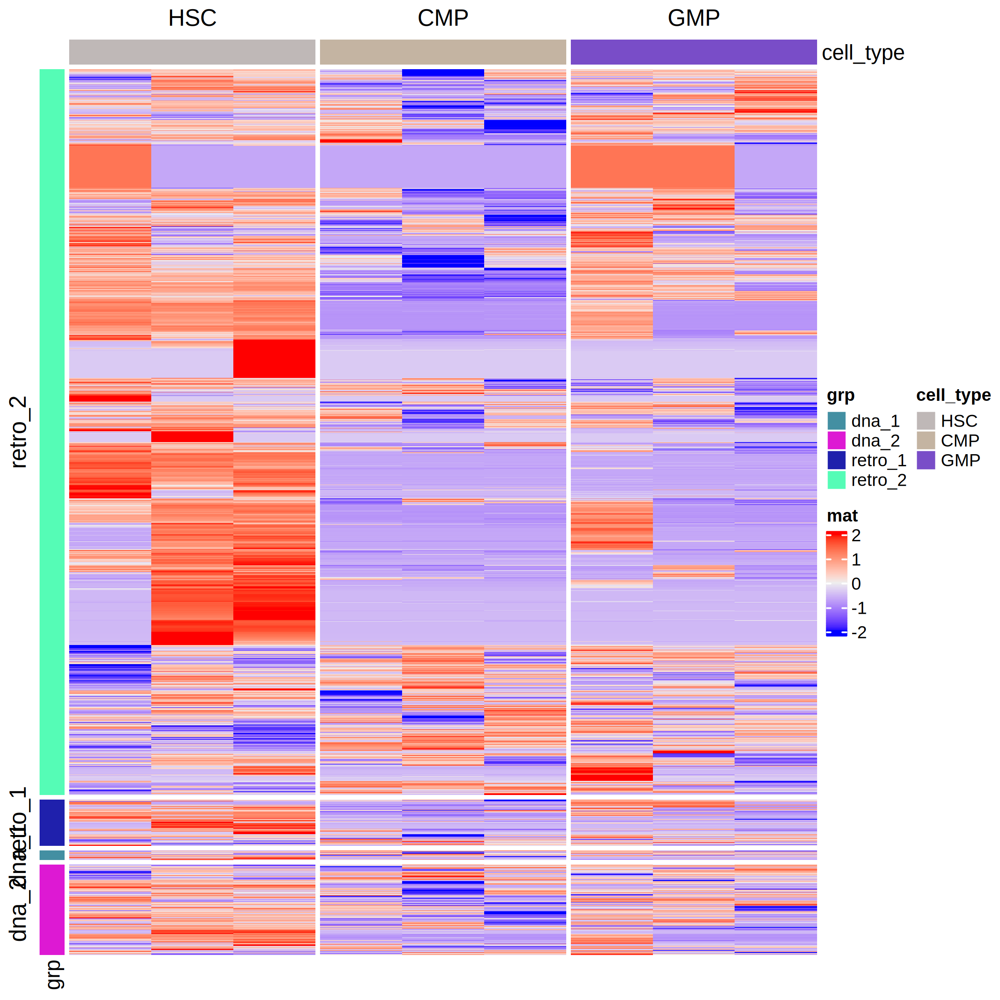

In [671]:
ov = intersect(rownames(logcpm_mye), cl$geneId)
length(ov)

cl2 = cl[geneId %in% ov, ][!duplicated(geneId), ] 
cl2_df = setDF(copy(cl2), rownames = cl2$geneId)

plotdat = logcpm_mye[ov, rownames(dsn_rna)]
plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2


column_ha = HeatmapAnnotation(df = dsn_rna[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = cl2_df[, 'grp', drop = F]) 
options(repr.plot.width = 8, repr.plot.height = 8, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = cl2_df$grp, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_rna$cell_type))  

In [674]:
deg_coding_mye = readRDS('data/deg_coding_CMPMEP_dt.rds')
deg_coding_mye = deg_coding_mye[batch == 'CMP', ]
head(deg_coding_mye) 

.id,rn,logFC,logCPM,PValue,FDR,tag,batch,target
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
deg_coding_CMP_GMP,CSF1R,-10.385076,4.766839,2.177808e-16,1.252544e-11,CMP_GMP,CMP,GMP
deg_coding_CMP_GMP,PRG2,4.530755,7.551013,3.203992e-15,9.213719e-11,CMP_GMP,CMP,GMP
deg_coding_CMP_GMP,DNTT,-10.702673,4.088003,6.908199e-10,1.324394e-05,CMP_GMP,CMP,GMP
deg_coding_CMP_GMP,LYZ,-3.017423,8.472903,8.793275e-09,1.264341e-04,CMP_GMP,CMP,GMP
deg_coding_CMP_GMP,EBF1,-10.556095,3.393450,1.410318e-08,1.622261e-04,CMP_GMP,CMP,GMP
deg_coding_CMP_GMP,LOC124904469,-9.253417,3.792760,2.658070e-08,2.547937e-04,CMP_GMP,CMP,GMP


In [684]:
deg_coding_mye[rn %in% cl[, geneId] & target == 'HSC' & FDR < .05, ]

.id,rn,logFC,logCPM,PValue,FDR,tag,batch,target
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
deg_coding_CMP_HSC,EBF1,-10.556095,3.393450,1.410318e-08,0.0001622261,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,CACNB4,-11.928691,2.772457,5.468286e-07,0.0028591183,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,ZSCAN32,-8.737021,3.087804,1.349420e-06,0.0059654673,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,MPO,-3.333523,11.963096,1.555830e-06,0.0059654673,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,NAPSB,-13.041210,2.159986,9.063993e-06,0.0239061464,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,LINC02035,-12.955294,2.074362,1.624622e-05,0.0359378889,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,FHIP2A,-3.288692,5.323804,2.099750e-05,0.0407801044,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,ZNF483,-9.588750,2.631762,2.163597e-05,0.0407801044,CMP_HSC,CMP,HSC
deg_coding_CMP_HSC,TESPA1,2.196958,7.554876,2.257735e-05,0.0407801044,CMP_HSC,CMP,HSC


[1] 13

Warning message:
"Values in row annotation 'grp' have a different order of names from the
matrix row names. It may lead to wrong conclusion of your data. Please
double check."


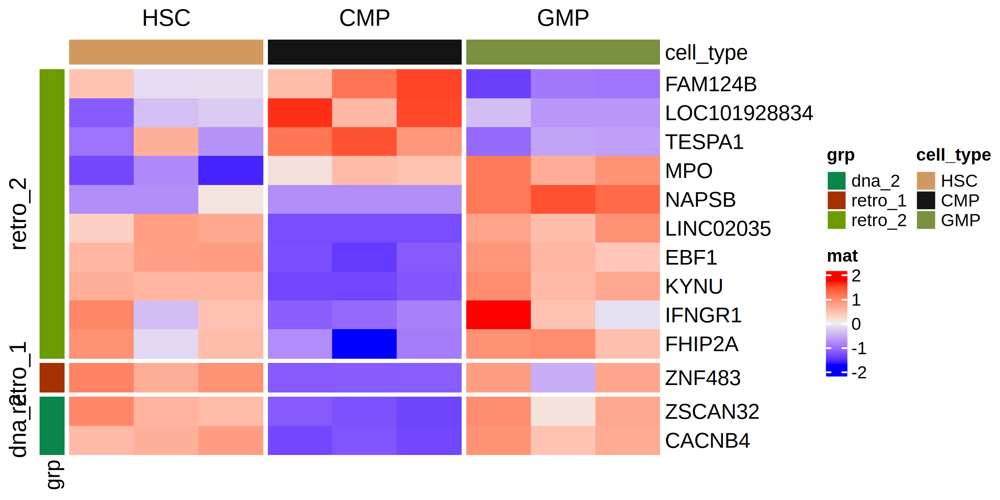

In [689]:
ov = intersect(rownames(logcpm_mye), cl$geneId)
ov = intersect(ov, deg_coding_mye[rn %in% cl[, geneId] & target == 'HSC' & FDR < .2, rn]) 
length(ov)

cl2 = cl[geneId %in% ov, ][!duplicated(geneId), ] 
cl2_df = setDF(copy(cl2), rownames = cl2$geneId)

plotdat = logcpm_mye[ov, rownames(dsn_rna)]
plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2


column_ha = HeatmapAnnotation(df = dsn_rna[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = cl2_df[, 'grp', drop = F]) 
options(repr.plot.width = 8, repr.plot.height = 4, repr.plot.res = 300)
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = cl2_df$grp, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_rna$cell_type))  

# export 

In [31]:
file.size('data/peak_dt_nb_TE_HSC_ATAC_bowtieWa.rds')

[1] 213969196

In [30]:
saveRDS( peak_dt, file = 'data/peak_dt_nb_TE_HSC_ATAC_bowtieWa.rds' )

In [10]:
fwrite(dsn, file = 'data/dsn_atac_12Jul.tsv', sep = '\t')

In [18]:
atac_dsn = fread('data/dsn_atac_12Jul.tsv')
dim(atac_dsn)

[1] 96 78

In [14]:
atac_cell_types = c('HSC', 'HSPC', 'MPP', 'CMP', 'GMP', 'MEP', 'CLP', 'CBCD34', 'LSC', 'pHSC', 'CD34', 'blast', 'preproB', 'ProB', 'B', 'DC', 
               'CD4', 'CD8', 'NK', 'Mono', 'Neu', 'EB', 'BFUE', 'CFUE', 'proE', 'Ebaso', 'polyE', 'orthoE')
               
atac_dsn[, cell_type := factor(cell_type, levels = atac_cell_types)]

In [95]:
table(atac_dsn$cell_type)


      B    BFUE   blast  CBCD34    CD34     CD4     CD8    CFUE     CLP     CMP 
      3       2      15       1       2       4       4       2       3       1 
     DC      EB   Ebaso     GMP     HSC    HSPC     LSC     MEP    Mono     MPP 
      1       3       4       1       4       2       8       1       1       1 
    Neu      NK  orthoE    pHSC   polyE preproB    ProB    proE 
      2       4       2      15       2       3       3       2 

In [96]:
getwd()

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan"

In [22]:
save.image(file = 'nb_TE_HSC_ATAC.rdata')

In [33]:
load('nb_TE_HSC_ATAC.rdata')

In [8]:
file.size('nb_TE_HSC_ATAC.rdata')

[1] 273206

In [43]:
atac_dsn2 = fwrite(atac_dsn2, file = 'data/atac_dsn2.tsv')

# delete sam file

- do it in the terminal
- trimmed fastq file
- merged fastq file
- sam file
- are all removed 